# Tarea N°01

## Instrucciones

1.- Completa tus datos personales (nombre y rol USM) en siguiente celda.


* __Nombre__: Diego Nicolás Hipólito Mera Muñoz

* __Rol__: 201511502-8

2.- Debes _pushear_ este archivo con tus cambios a tu repositorio personal del curso, incluyendo datos, imágenes, scripts, etc.

3.- Se evaluará:
    - Soluciones
    - Código
    - Que Binder esté bien configurado.
    - Al presionar  `Kernel -> Restart Kernel and Run All Cells` deben ejecutarse todas las celdas sin error.

## I.-  Imagenception

Desde [Wikipedia](https://es.wikipedia.org/wiki/RGB), __RGB__ (sigla en inglés de red, green, blue) es un modelo de color basado en la síntesis aditiva, con el que es posible representar un color mediante la mezcla por adición de los tres colores de luz primarios. El modelo de color RGB no define por sí mismo lo que significa exactamente rojo, verde o azul, por lo que los mismos valores RGB pueden mostrar colores notablemente diferentes en distintos dispositivos que usen este modelo de color. Aunque utilicen un mismo modelo de color, sus espacios de color pueden variar considerablemente.

Para indicar con qué proporción es mezclado cada color, se asigna un valor a cada uno de los colores primarios, de manera que el valor "0" significa que no interviene en la mezcla y, a medida que ese valor aumenta, se entiende que aporta más intensidad a la mezcla. Aunque el intervalo de valores podría ser cualquiera (valores reales entre 0 y 1, valores enteros entre 0 y 37, etc.), es frecuente que cada color primario se codifique con un byte (8 bits).

Así, de manera usual, la intensidad de cada una de las componentes se mide según una escala que va del 0 al 255 y cada color es definido por un conjunto de valores escritos entre paréntesis (correspondientes a valores "R", "G" y "B") y separados por comas.

El conjunto de todos los colores también se puede representar en forma de cubo. Cada color es un punto de la superficie o del interior de éste. La escala de grises estaría situada en la diagonal que une al color blanco con el negro.

![rgb](https://upload.wikimedia.org/wikipedia/commons/thumb/a/a9/Avl3119color4a.svg/800px-Avl3119color4a.svg.png)

Para efectos prácticos del curso, es posible representar cada pixel de una imagen con un array de 3 dimensiones, cada valor representa a una de las capas RGB. Por lo tanto, una imagen de $n \times m$ pixeles se representa como un arreglo de dimension $(n, m , 3)$ En `Python` una de las librerías de procesamiento de imágenes más utilizada es `Pillow`.

Abrir una imagen es tan fácil como:

In [1]:
# Importamos las librerias necesarias

import os
import numpy as np
from PIL import Image

In [2]:
gatito = Image.open(os.path.join("images", "gatito.png")) # cargamos la imagen

Notar que la variable anterior es de una clase específica de la librería.

In [3]:
type(gatito) # Analizamos la información de la imagen

PIL.PngImagePlugin.PngImageFile

Para ver la imagen en Jupyter puedes utilizar la misma técnica que con los `pd.DataFrames`, es decir:

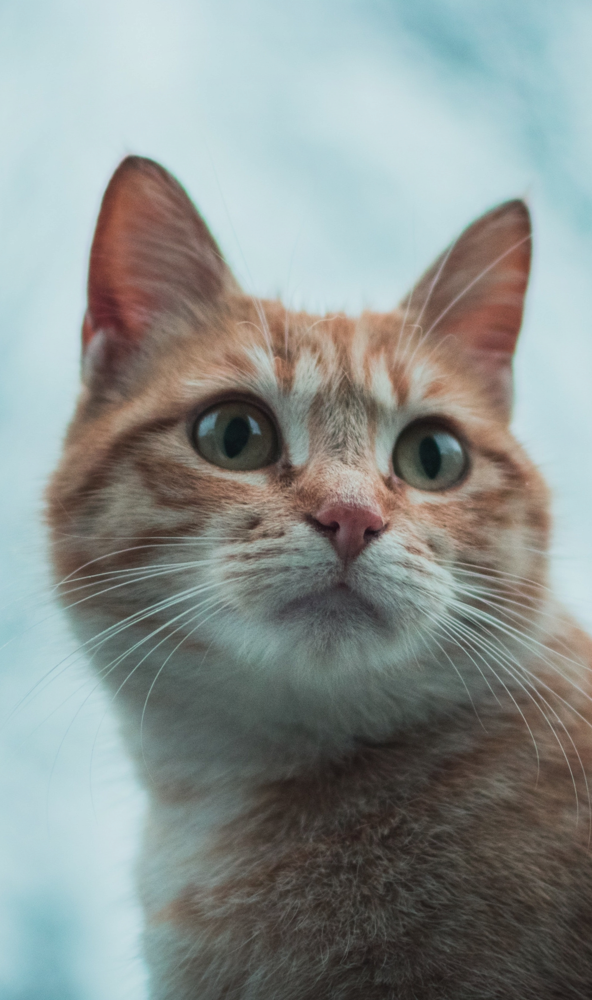

In [4]:
gatito # Mostramos la imágen

Para tener su representación en un array podemos utilizar el constructor `np.array` con argumento la imagen.

In [5]:
gatito_np = np.array(gatito)
print(f"Dimension de la imagen gatito: {gatito_np.shape}.\n")
print(f"Al convertir a np.ndarry el tipo de elementos es {gatito_np.dtype}.\n")
print(gatito_np)

Dimension de la imagen gatito: (2160, 1280, 3).

Al convertir a np.ndarry el tipo de elementos es uint8.

[[[179 211 215]
  [179 211 215]
  [179 209 215]
  ...
  [171 201 209]
  [171 201 209]
  [169 199 207]]

 [[181 213 217]
  [181 213 217]
  [181 211 217]
  ...
  [173 203 211]
  [173 203 211]
  [171 201 209]]

 [[179 211 215]
  [179 211 215]
  [181 211 217]
  ...
  [173 203 211]
  [173 203 211]
  [173 203 211]]

 ...

 [[125 179 190]
  [123 177 188]
  [129 183 194]
  ...
  [ 41  36  33]
  [ 43  38  35]
  [ 45  40  37]]

 [[127 181 192]
  [125 179 190]
  [127 181 192]
  ...
  [ 43  38  37]
  [ 43  38  37]
  [ 45  40  37]]

 [[125 179 190]
  [123 177 188]
  [123 177 188]
  ...
  [ 49  44  43]
  [ 45  40  37]
  [ 43  38  35]]]


### 1.- Encontrando la imagen oculta

La imagen anterior tiene una imagen oculta, el ejercicio corresponde en descifrarlo. Las instrucciones son las siguientes:

1.1 Crear una lista vacía declarada como `secret_list`.

In [23]:
secret_list = list() # Crear lista

1.2 Iterar por cada uno de los canales RGB (`gatito_np.shape[2]`) y en cada iteración:
 * Crear un arreglo temporal llamado `secret_aux` de dos dimensiones, de la misma dimension de pixeles de la imagen `gatito` y que tenga valores enteros, `0` si el valor de la capa de `gatito_np` es par y `1` si es impar. 
  - No iterar por filas y columnas.
  - Utilizar la operación módulo `%`. 
  - En la i-ésima iteración de los canales la capa de `gatito_np` es `gatito_np[:, :, i]`.
        
        
 * Escalar `secret_aux` a valores 0 y 255.
    
 * Cambiar el `dtype` de `secret_aux` a `np.uint8` (utilize el méteodo `astype()`).
            
 * Agregue `secret_aux` a `secret_list`.
    
Al final de la iteración `secret_list` debe tener solo tres arreglos.

**Observación:** recuerde que puede aplicar operaciones directo a un arreglo de numpy.

In [24]:
for channel in range(gatito_np.shape[2]): # recorremos la data 
    secret_aux = gatito_np[:,:,channel]%2 # Determinamos valores par e impar
    secret_aux = (secret_aux>0)*255 # los mayores a 0 (impar=1) se multiplica por 255
    secret_aux = secret_aux.astype('uint8') # se modifica el tipo a 'uint8'
    secret_list.append(secret_aux) # Se agrega secret_aux a secret_list
    print(secret_list)

[array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8)]
[array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255]], dtype=uint8), array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       ...,
       [255, 255, 255, ...,   0,   0,   0],
       [255, 255, 255, ...,   0,   0,   0],
       [255, 255, 255, ...,   0,   0,   0]], dtype=uint8)]
[array([[255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255, 255],
       [255, 255, 255, ..., 255, 255

In [25]:
print(f"secret_list tiene {len(secret_list)} elementos") # mostramos la cantidad de elementos que tiene secret list

secret_list tiene 3 elementos


1.3 Crear la variable `secret_np` concatenando horizontalmente los elementos de `secret_list`.

In [26]:
secret_np = np.concatenate((secret_list[0],secret_list[1],secret_list[2]), axis=1) # se concatena
secret_np.shape # se imprime el tamaño

(2160, 3840)

1.4 Crear el objeto `secret_img` utilizando el arreglo `secret_np`, asegurar que los valores estén entre 0 y 255, y que el dtype sea `np.uint8`, con el método `Image.fromarray` con argumento `mode="L"`

In [27]:
np.unique(secret_np) # mostramos que los valores estan entre 0 y 255, y que sea de tipo uint8.

array([  0, 255], dtype=uint8)

In [28]:
secret_np.dtype

dtype('uint8')

In [29]:
secret_img = Image.fromarray(secret_np)

Ahora puedes ver el resultado!

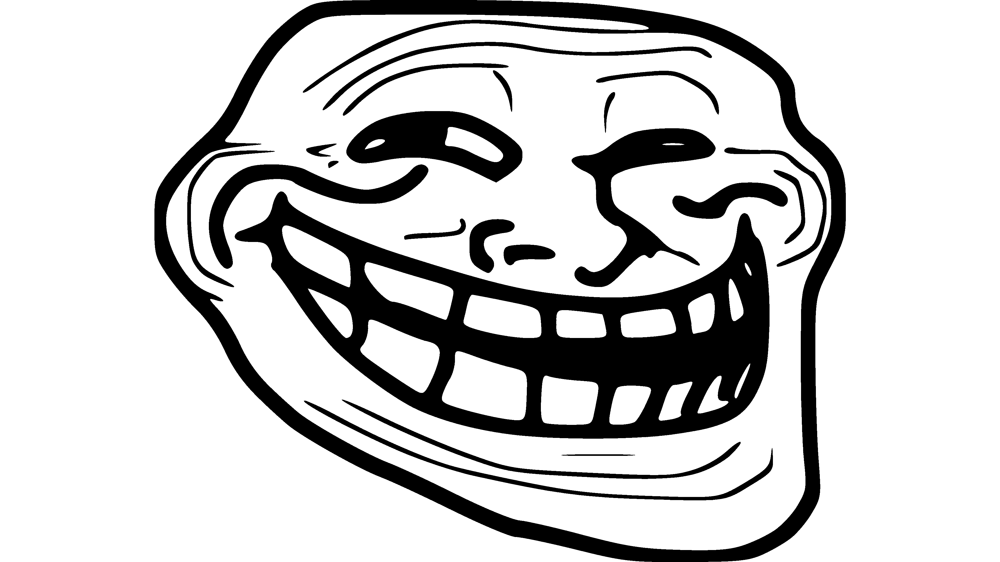

In [30]:
secret_img # mostramos finalmente la imagen

### 2.- Escondiendo una nueva imagen

Es tu turno, ahora tu esconderás una imagen. Las instrucciones son las siguientes:

2.1 Selecciona una imagen de 2160 x 3840 pixeles (a.k.a resolución 4k), lo importante es que sea solo en blanco y negro, en la carpeta `images` se disponibiliza como ejemplo la imagen `black_and_white_example.jpg` y crea una variable llamada `my_img` leyendo la imagen seleccionada con `Image.open()`.

In [171]:
my_img = Image.open(os.path.join("images", "baw.jpg")) # se carga la imagen seleccionada

2.2 Crea un arreglo llamado `my_img_np` utilizando `my_img` y el método `np.array()`.
    * Es importante que `my_img_np.shape` sea `(2160, 3840)`, es decir, que solo sea de dos dimensiones. Esto porque es una imagen en blanco y negro, no necesitando el modelo RGB.

In [172]:
my_img_np = np.array(my_img)
print(my_img_np.shape) # se verifica que sea de las dimensiones necesarias. El que no tenga un tercer termino nos indica que es solo de dos dimensiones

(2160, 3840)


2.3 Crear la variable `my_img_np_aux` utilizando un _umbral_ con tal de que:
    - 1: Si el valor del pixel es mayor  al _umbral_.
    - 0: Si el valor del pixel es menor o igual al _umbral_.
    - El `dtype` debe ser `np.uint8`.
    - Para `black_and_white_example.jpg` un umbral adecuado es `20`.

In [187]:
umbral = 110       # Cambie el umbral a 110 para poder apreciar mejor la imagen.
my_img_np_aux = 0
my_img_np_aux = (my_img_np > umbral).astype(np.uint8) # se pasa la imagen a booleanos segun el umbral y luego a 0 y 1

# La siguiente línea realiza lo mismo, solo que no es tan eficiente.
#my_img_np_aux = 1*np.greater_equal(my_img_np, umbral*np.ones(shape=my_img_np.shape)).astype(np.uint8)

Puedes probar que tan bien quedó la imagen con la siguiente linea. Si crees que no se ve bien, puedes cambiar el _umbral_.

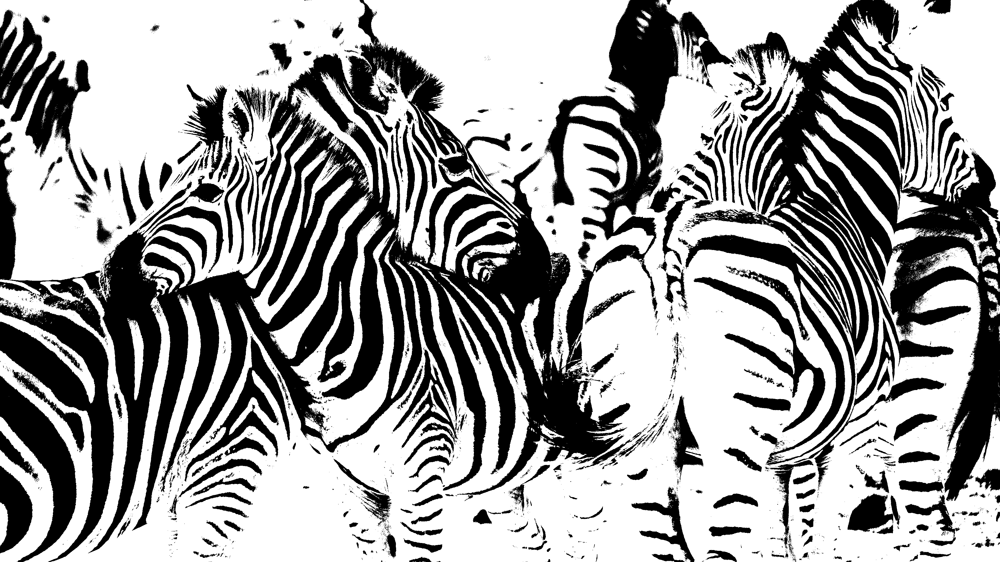

In [188]:
Image.fromarray(my_img_np_aux * 255) # mostramos la imagen

2.4 Dividir la imagen en tres arreglos de tamaño (2160, 1280) y guardarlos en una lista con el nombre `my_img_split`. Hint: Revisa en la documentación de `numpy`.

In [189]:
my_img_split = np.split(my_img_np_aux,3,axis=1)  # con axis=0 divide en el otro sentido (Imagenes de 720x3840)

Revisa utilizando la siguiente iteración.

In [190]:
for img_array in my_img_split:
    print(img_array.shape) # imprimo los tamaños para revisar la división de la imagen

(2160, 1280)
(2160, 1280)
(2160, 1280)


2.5 La imagen donde se esconderá tu imagen selecionada está en la carpeta `images` con el nombre `gatito_original.png`, que sospechosamente es de 2160 x 1280 pixeles. Carga la imagen en la variable `cat` y luego crea arreglo `cat_np` utilizando `cat`. Verifica que `cat_np.shape = (2160, 1280, 3)`.

In [191]:
cat = Image.open(os.path.join("images", "gatito_original.png")) # cargamos la imagen donde ocultaremos la cargada previamente.
cat_np = np.array(cat)
print(cat_np.shape) 

(2160, 1280, 3)


2.6 Convierte todos los valores de `cat_np` a valores pares. Esto lo puedes hacer sumando 1 a cada valor de arreglo si es impar

In [192]:
cat_np = cat_np + (cat_np%2) # Elmódulo % nos devuelve 0 si es par y 1 si es impar.
print(cat_np.shape)

(2160, 1280, 3)


2.7 Itera por canal RGB de `cat_np` y en cada capa suma los valores de uno de los arreglos de `my_img_split`.

In [193]:
for channel in range(cat_np.shape[2]): # iteramos por capa
    cat_np[:,:,channel] += my_img_split[channel] # sumamos los valores de uno de los arreglos

2.8 Crea una variable llamada `cat_secret_im` con `Image.fromarray` y la variable `cat_np` (que ya ha sido modificada). Luego guarda la imagen en la carpeta `images` con el nombre `my_secret.png`.

In [194]:
cat_secret_im = Image.fromarray(cat_np) # creamos variable
cat_secret_im.save(os.path.join("images", "my_secret.png")) # guardamos la imagen

2.9 Crea una función llamada `imagenception()` que como argumento tenga la ruta de la imagen que quieres descifrar y que descifre la imagen secreta recientemente creada. Hint: Utiliza todos los pasos de la primera parte. 

In [195]:
def imagenception(filepath):
    Imagen_original= Image.open(filepath)        # Se abre la imagen
    Imagen_original_np=np.array(Imagen_original) # Convertimos a arreglo de NumPy (matriz que representa la imagen)
    
    secret_list = list() # Se crea una lista vacía
    
    for channel in range(Imagen_original_np.shape[2]):  # Se rellena la lista según lo hecho en sección previa
        secret_aux = Imagen_original_np[:,:,channel]%2
        secret_aux = (secret_aux>0)*255
        secret_aux = secret_aux.astype(np.uint8)
        secret_list.append(secret_aux) 
    
    # Se concatena la información de los tres canales
    secret_np = np.concatenate((secret_list[0],secret_list[1],secret_list[2]),axis=1) 
        
    # Se crea la imagen secreta
    secret_img = Image.fromarray(secret_np)   
   
    return secret_img #Retornamos la imagen

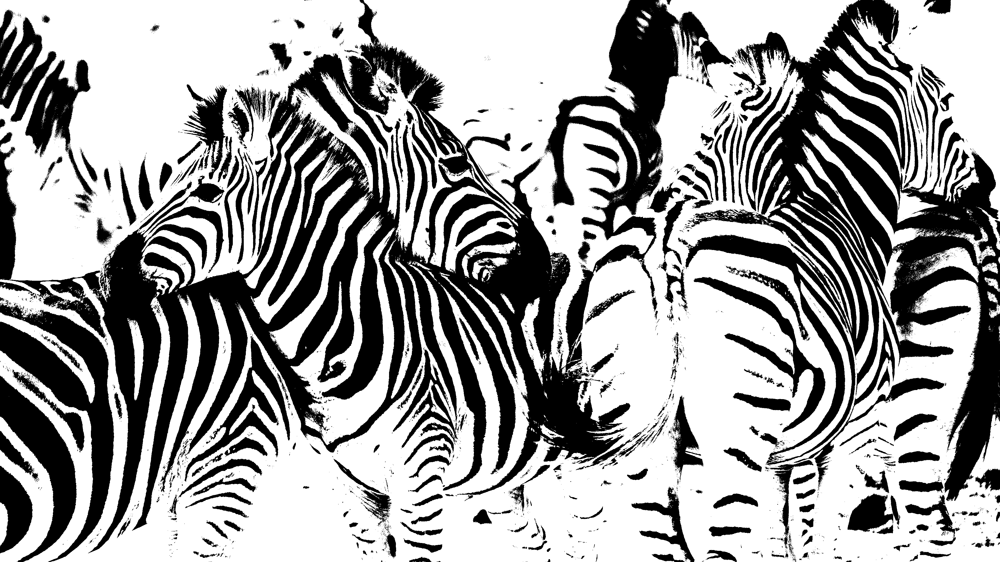

In [196]:
my_secret_img = imagenception(os.path.join("images", "my_secret.png"))
my_secret_img # Finalmente mostramos la imagen

## II.- Analizando la Felicidad

<img src="https://static01.nyt.com/images/2019/09/29/opinion/sunday/29HolsonStill/29HolsonStill-popup.jpg" width="480" height="360" align="center"/>

Este ejercicio es netamente análisis de datos, tratando de abarcar problemas típicos como la lectura de datos, corrección de errores, métricas agrupadas, unión de datos, etc. Utilizaremos un conjunto de datos llamado __World Happiness Report__ disponible en el siguiente [link](https://www.kaggle.com/unsdsn/world-happiness), de donde se puede obtener información al respecto.

#### Context
The World Happiness Report is a landmark survey of the state of global happiness. The first report was published in 2012, the second in 2013, the third in 2015, and the fourth in the 2016 Update. The World Happiness 2017, which ranks 155 countries by their happiness levels, was released at the United Nations at an event celebrating International Day of Happiness on March 20th. The report continues to gain global recognition as governments, organizations and civil society increasingly use happiness indicators to inform their policy-making decisions. Leading experts across fields – economics, psychology, survey analysis, national statistics, health, public policy and more – describe how measurements of well-being can be used effectively to assess the progress of nations. The reports review the state of happiness in the world today and show how the new science of happiness explains personal and national variations in happiness.

#### Content
The happiness scores and rankings use data from the Gallup World Poll. The scores are based on answers to the main life evaluation question asked in the poll. This question, known as the Cantril ladder, asks respondents to think of a ladder with the best possible life for them being a 10 and the worst possible life being a 0 and to rate their own current lives on that scale. The scores are from nationally representative samples for the years 2013-2016 and use the Gallup weights to make the estimates representative. The columns following the happiness score estimate the extent to which each of six factors – economic production, social support, life expectancy, freedom, absence of corruption, and generosity – contribute to making life evaluations higher in each country than they are in Dystopia, a hypothetical country that has values equal to the world’s lowest national averages for each of the six factors. They have no impact on the total score reported for each country, but they do explain why some countries rank higher than others.


### 2.1 Lectura de datos

In [197]:
# Cargamos las librerias necesarias.
import os
import pandas as pd
pd.set_option("display.max_columns", 999)  # Permite mostrar hasta 999 columnas de un DataFrame en Jupyter.

En la carpeta `data/world-happiness` se disponen de tres archivos, uno por cada reporte anual (años 2015, 2016 y 2017). No es de sorprender que envíen un archivo por año (podría ser mensual, semestral, etc.), lo imortante es ser capaces de leer una cantidad __variable__ de archivos al mismo tiempo. Una buena práctica es crear un diccionario de dataframes.

In [198]:
# Comprehension dictionary
df_dict = {
    year: pd.read_csv(os.path.join("data", "world-happiness", f"{year}.csv"))
    for year in [2015, 2016, 2017]
}

Por ejemplo, se puede acceder al DataFrame asociado al archivo `data/world-happiness/2016.csv` de la siguiente manera:

In [199]:
df_dict[2016].head()

,Country,Region,Happiness Rank,Happiness Score,Lower Confidence Interval,Upper Confidence Interval,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual
0,Denmark,Western Europe,1,7.526,7.460,7.592,1.44178,1.16374,0.79504,0.57941,0.44453,0.36171,2.73939
1,Switzerland,Western Europe,2,7.509,7.428,7.590,1.52733,1.14524,0.86303,0.58557,0.41203,0.28083,2.69463
2,Iceland,Western Europe,3,7.501,7.333,7.669,1.42666,1.18326,0.86733,0.56624,0.14975,0.47678,2.83137
3,Norway,Western Europe,4,7.498,7.421,7.575,1.57744,1.12690,0.79579,0.59609,0.35776,0.37895,2.66465
4,Finland,Western Europe,5,7.413,7.351,7.475,1.40598,1.13464,0.81091,0.57104,0.41004,0.25492,2.82596


Una pequeña descripción de las columnas

* `Country` Name of the country.
* `Region` Region the country belongs to.
* `Happiness Rank` Rank of the country based on the Happiness Score.
* `Happiness Score` A metric measured in 2015 by asking the sampled people the question: "How would you rate your happiness on a scale of 0 to 10 where 10 is the happiest."
* `Standard Error` The standard error of the happiness score.
* `Economy (GDP per Capita)` The extent to which GDP contributes to the calculation of the Happiness Score.
* `Family` The extent to which Family contributes to the calculation of the Happiness Score
* `Health (Life Expectancy)` The extent to which Life expectancy contributed to the calculation of the Happiness Score
* `Freedom` The extent to which Freedom contributed to the calculation of the Happiness Score.
* `Trust (Government Corruption)` The extent to which Perception of Corruption contributes to Happiness Score.
* `Generosity` The extent to which Generosity contributed to the calculation of the Happiness Score.
* `Dystopia Residual` The extent to which Dystopia Residual contributed to the calculation of the Happiness Score.

Notar que los conjuntos de datos no poseen las mismas columnas, por lo tanto, solo se trabajarán con las columnas en común y posteriormente agregaremos el año con tal de concatenar los tres conjuntos.

In [202]:
from functools import reduce
intersection_columns = reduce(np.intersect1d, [df_i.columns.values for df_i in df_dict.values()]).tolist() + ["Year"]
print(intersection_columns)

['Country', 'Dystopia Residual', 'Economy (GDP per Capita)', 'Family', 'Freedom', 'Generosity', 'Happiness Rank', 'Happiness Score', 'Health (Life Expectancy)', 'Trust (Government Corruption)', 'Year']


Explica con tus palabras las operaciones que se realizaron para obtener la variable `intersection_columns`.

__Respuesta:__ Análizando primero la función "reduce", lo que esta hace es aplicar la función "np.intersect1d" de forma ciclica o recursiva a cada columna del data frame. En este caso, los años analizados son 2015, 2016 y 2017, y son los datos de estos años los que son intersectados. Luego, se aplica .tolist(), la cual transforma el objeto a lista. Finalmente se agregar "Year" a la lista de concatenación. Siendo más explicitos, se obtienen las columnas con df_i.columns.values y se va iterando sobre df_dict.values()

### 2.2 Concatenación y procesado

Define el DataFrame `happiness` tal que:

* Sea la concatenación de los dataframes de `df_dict`
    - Nota que en la documentación de `pd.concat` puedes entregar como argumento directamente un diccionario.
    - No ordenes los _axis_ (ver documentación).
    - Los nombres de los _levels_ para los multi-index resultante deben ser `["Year", "drop_me"]`.
* Aplica el método `drop_level` con tal de eliminar el nivel del multi-index llamado `drop_me`.
* Resetea los índices.
* Selecciona solo las columnas de la lista `intersection_columns`.
* Los nombres de las columnas deben estar en minísculas, reemplazar espacios por guiones bajos (`_`) y elimina los paréntesis.


In [203]:
happiness = (
    pd.concat(df_dict,names=["Year", "drop_me"],sort=False) # Concatenar según los nombres indicados
    .droplevel("drop_me") # eliminar el nivel multi-index "drop_me"
    .reset_index() # resetear índices
    .loc[:,intersection_columns] # Fijar columna
    .rename(columns=lambda x: x.lower().replace(' ','_').replace("(","").replace(")","")) # dejar nombres en minúscula, reemplazar espacios por guiones bajos (_) y elimina los paréntesis
)
happiness.head() # imprimir las primeras filas del dataframe

,country,dystopia_residual,economy_gdp_per_capita,family,freedom,generosity,happiness_rank,happiness_score,health_life_expectancy,trust_government_corruption,year
0,Switzerland,2.51738,1.39651,1.34951,0.66557,0.29678,1,7.587,0.94143,0.41978,2015
1,Iceland,2.70201,1.30232,1.40223,0.62877,0.43630,2,7.561,0.94784,0.14145,2015
2,Denmark,2.49204,1.32548,1.36058,0.64938,0.34139,3,7.527,0.87464,0.48357,2015
3,Norway,2.46531,1.45900,1.33095,0.66973,0.34699,4,7.522,0.88521,0.36503,2015
4,Canada,2.45176,1.32629,1.32261,0.63297,0.45811,5,7.427,0.90563,0.32957,2015


### 2.3 Análisis

Como siempre, partimos con un análisis descriptivo simple.

In [ ]:
happiness.describe(include="all").fillna("").T # se describen los datos reemplazando los Nan por vacios.

¿Cuántos países no tienen mediciones de felicidad en los tres años del estudio? ¿Cuáles son?

In [204]:
# Se filtran los datos en base a lo solicitado.
no_happiness = happiness.groupby("country").filter(lambda x: len(x)<3)["country"].unique()
print('La cantidad de países sin medición de felicidad en los 3 años de estudio son: ',len(no_happiness))

La cantidad de países sin medición de felicidad en los 3 años de estudio son:  20


In [206]:
print(f"Los países sin medición de felicidad en los últimos 3 años son: \n\n {no_happiness} \n")

Los países sin medición de felicidad en los últimos 3 años son: 

 ['Oman' 'Taiwan' 'Suriname' 'Hong Kong' 'Somaliland region' 'Mozambique'
 'Lesotho' 'Laos' 'Swaziland' 'Djibouti' 'Comoros'
 'Central African Republic' 'Puerto Rico' 'Belize' 'Somalia'
 'Somaliland Region' 'Namibia' 'South Sudan' 'Taiwan Province of China'
 'Hong Kong S.A.R., China'] 



__Respuesta:__  Según lo analizado se tiene que 20 países no tienen mediciones de felicidad en los tres años del estudio. Estos son Oman, Taiwan, Suriname, Hong Kong, Somalilan region, Mozambique, Lesotho, Laos, Swaziland, Djibouti, Comoros, Central African Republic, Puerto Rico, Belize, Somalia, Somaliand Region, Namibia, South Sudan, Taiwan Province of Chine, Hong Kong S.A.R y China.

Note que la lista de países proveniente de la pregunta anterior tiene errores de consistencia, por ejemplo están los registros de `Hong Kong` y `Hong Kong S.A.R., China` que escencialmente son el mismo. Lo mismo ocurre con `Taiwan` y `Somaliland Region`.

Modifique la columna `country` del dataframe `happiness` con tal de reparar los errores de `Hong Kong`, `Taiwan` y `Somaliland Region`.

In [209]:
bad_country_names_dict = {"Hong Kong S.A.R., China": "Hong Kong", "Taiwan Province of China": "Taiwan", "Somaliland region": "Somaliland Region"}
happiness = happiness.assign(country=lambda x: x['country'].map(bad_country_names_dict).fillna(x['country']))

# Para resolver lo que se hace es pasar a Nan los valores correctos y se transformar los errones. 
# Una vez realizado esta corrección se rellena con los países correctos.

Luego de la modificación, ¿Cuántos países no tienen mediciones en los tres años de estudio?

In [213]:
# Volvemos a filtrar, esta vez con las correcciones aplicadas.
no_happiness_fix = happiness.groupby("country").filter(lambda x: len(x)<3)["country"].unique()
print(f"La cantidad de países sin medición de felicidad en los 3 años de estudio son:  {len(no_happiness_fix)} \n")
print(f"Los países sin medición de felicidad en los últimos 3 años son: \n\n {no_happiness_fix} \n")

La cantidad de países sin medición de felicidad en los 3 años de estudio son:  15 

Los países sin medición de felicidad en los últimos 3 años son: 

 ['Oman' 'Suriname' 'Somaliland Region' 'Mozambique' 'Lesotho' 'Laos'
 'Swaziland' 'Djibouti' 'Comoros' 'Central African Republic' 'Puerto Rico'
 'Belize' 'Somalia' 'Namibia' 'South Sudan'] 



__Respuesta:__  Una vez realizada la corrección la cantidad de países sin medición de felicidad en los 3 años de estudio se redujo a 15, siendo estos Oman, Suriname, Somalilan region, Mozambique, Lesotho, Laos, Swaziland, Djibouti, Comoros, Central African Republic, Puerto Rico, Belize, Somalia, Namibia, South Sudan. 

Pivotea el dataframe `happines` tal que los índices sean los años, las columnas los países y el valor su `happiness_score`. LLena los valores nulos con un _string_ vacío `""`. Un país no puede tener más de un registro por año, por lo que puedes utilizar directamente el médoto `pd.DataFrame.pivot()`.


In [218]:
# DataFrame.pivot(index=None, columns=None, values=None) 
# Devuelve el DataFrame remodelado organizado por valores de índice/columna dados.

# DataFrame.fillna(value=None, method=None, axis=None, inplace=False, limit=None, downcast=None)
# Completa los valores NA / NaN utilizando el método especificado. En este caso un string vacío.

happiness.pivot(index='year',columns='country',values='happiness_score').fillna("")

country,Afghanistan,Albania,Algeria,Angola,Argentina,Armenia,Australia,Austria,Azerbaijan,Bahrain,Bangladesh,Belarus,Belgium,Belize,Benin,Bhutan,Bolivia,Bosnia and Herzegovina,Botswana,Brazil,Bulgaria,Burkina Faso,Burundi,Cambodia,Cameroon,Canada,Central African Republic,Chad,Chile,China,Colombia,Comoros,Congo (Brazzaville),Congo (Kinshasa),Costa Rica,Croatia,Cyprus,Czech Republic,Denmark,Djibouti,Dominican Republic,Ecuador,Egypt,El Salvador,Estonia,Ethiopia,Finland,France,Gabon,Georgia,Germany,Ghana,Greece,Guatemala,Guinea,Haiti,Honduras,Hong Kong,Hungary,Iceland,India,Indonesia,Iran,Iraq,Ireland,Israel,Italy,Ivory Coast,Jamaica,Japan,Jordan,Kazakhstan,Kenya,Kosovo,Kuwait,Kyrgyzstan,Laos,Latvia,Lebanon,Lesotho,Liberia,Libya,Lithuania,Luxembourg,Macedonia,Madagascar,Malawi,Malaysia,Mali,Malta,Mauritania,Mauritius,Mexico,Moldova,Mongolia,Montenegro,Morocco,Mozambique,Myanmar,Namibia,Nepal,Netherlands,New Zealand,Nicaragua,Niger,Nigeria,North Cyprus,Norway,Oman,Pakistan,Palestinian Territories,Panama,Paraguay,Peru,Philippines,Poland,Portugal,Puerto Rico,Qatar,Romania,Russia,Rwanda,Saudi Arabia,Senegal,Serbia,Sierra Leone,Singapore,Slovakia,Slovenia,Somalia,Somaliland Region,South Africa,South Korea,South Sudan,Spain,Sri Lanka,Sudan,Suriname,Swaziland,Sweden,Switzerland,Syria,Taiwan,Tajikistan,Tanzania,Thailand,Togo,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,Uganda,Ukraine,United Arab Emirates,United Kingdom,United States,Uruguay,Uzbekistan,Venezuela,Vietnam,Yemen,Zambia,Zimbabwe
year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2015,3.575,4.959,5.605,4.033,6.574,4.350,7.284,7.200,5.212,5.960,4.694,5.813,6.937,,3.340,5.253,5.890,4.949,4.332,6.983,4.218,3.587,2.905,3.819,4.252,7.427,3.678,3.667,6.670,5.140,6.477,3.956,3.989,4.517,7.226,5.759,5.689,6.505,7.527,4.369,4.885,5.975,4.194,6.130,5.429,4.512,7.406,6.575,3.896,4.297,6.750,4.633,4.857,6.123,3.656,4.518,4.788,5.474,4.800,7.561,4.565,5.399,4.686,4.677,6.940,7.278,5.948,3.655,5.709,5.987,5.192,5.855,4.419,5.589,6.295,5.286,4.876,5.098,4.839,4.898,4.571,5.754,5.833,6.946,5.007,3.681,4.292,5.770,3.995,6.302,4.436,5.477,7.187,5.889,4.874,5.192,5.013,4.971,4.307,,4.514,7.378,7.286,5.828,3.845,5.268,5.695,7.522,6.853,5.194,4.715,6.786,5.878,5.824,5.073,5.791,5.102,,6.611,5.124,5.716,3.465,6.411,3.904,5.123,4.507,6.798,5.995,5.848,,5.057,4.642,5.984,,6.329,4.271,4.550,6.269,4.867,7.364,7.587,3.006,6.298,4.786,3.781,6.455,2.839,6.168,4.739,5.332,5.548,3.931,4.681,6.901,6.867,7.119,6.485,6.003,6.810,5.360,4.077,5.129,4.610
2016,3.360,4.655,6.355,3.866,6.650,4.360,7.313,7.119,5.291,6.218,4.643,5.802,6.929,5.956,3.484,5.196,5.822,5.163,3.974,6.952,4.217,3.739,2.905,3.907,4.513,7.404,,3.763,6.705,5.245,6.481,3.956,4.236,4.272,7.087,5.488,5.546,6.596,7.526,,5.155,5.976,4.362,6.068,5.517,4.508,7.413,6.478,4.121,4.252,6.994,4.276,5.033,6.324,3.607,4.028,4.871,5.458,5.145,7.501,4.404,5.314,4.813,4.575,6.907,7.267,5.977,3.916,5.510,5.921,5.303,5.919,4.356,5.401,6.239,5.185,4.876,5.560,5.129,,3.622,5.615,5.813,6.871,5.121,3.695,4.156,6.005,4.073,6.488,4.201,5.648,6.778,5.897,4.907,5.161,5.151,,4.395,4.574,4.793,7.339,7.334,5.992,3.856,4.875,5.771,7.498,,5.132,4.754,6.701,5.538,5.743,5.279,5.835,5.123,7.039,6.375,5.528,5.856,3.515,6.379,4.219,5.177,4.635,6.739,6.078,5.768,5.44,5.057,4.459,5.835,3.832,6.361,4.415,4.139,6.269,,7.291,7.509,3.069,6.379,4.996,3.666,6.474,3.303,6.168,5.045,5.389,5.658,3.739,4.324,6.573,6.725,7.104,6.545,5.987,6.084,5.061,3.724,4.795,4.193
2017,3.794,4.644,5.872,3.795,6.599,4.376,7.284,7.006,5.234,6.087,4.608,5.569,6.891,5.956,3.657,5.011,5.823,5.182,3.766,6.635,4.714,4.032,2.905,4.168,4.695,7.316,2.693,3.936,6.652,5.273,6.357,,4.291,4.280,7.079,5.293,5.621,6.609,7.522,,5.230,6.008,4.735,6.003,5.611,4.460,7.469,6.442,4.465,4.286,6.951,4.120,5.227,6.454,3.507,3.603,5.181,5.472,5.324,7.504,4.315,5.262,4.692,4.497,6.977,7.213,5.964,4.180,5.311,5.920,

¿Qué información podrías sacar rápidamente de esta tabla pivoteada? ¿Podrías decir que siempre es útil pivotear una tabla?

__Respuesta:__  Respecto a información rápida, sería posible obtener datos estadísticos como la media o desviación estándar de algún país en específico. Si la tabla no tuviese una extensión tan grande esto resultaría muy útil. Dada la extensión de la tabla y lo incómodo que resulta revisar los datos concluyo que no siempre es útil pivotear una tabla.

En promedio, ¿Cuáles son los tres países con el mejor ranking de felicidad?

In [231]:
df = happiness.groupby("country").agg({'happiness_rank':'mean'}).sort_values('happiness_rank').reset_index()
df.head(3)

# Para resolver agrupamos primero por país. Una vez tenemos eso calculamos la media del ranking de felicidad.
# Luego, ordenamos de mayor a menor.
# Para la visualización se solicitan solo los 3 primeros países.

,country,happiness_rank
0,Denmark,2.000000
1,Switzerland,2.333333
2,Iceland,2.666667


__Respuesta:__  Si consideramos el menor ranking como el mejor. Los países con el mejor ranking son Dinamarca, Suiza e Islandia.

En promedio, ¿Cuáles son los tres países con el mayor _score_ de felicidad? ¿Son distintos a los con mejor ranking en promedio?

In [233]:
# Agrupamos segun lo solicitado, calculamos promerio y ordenamos de mayor a menor
df = happiness.groupby("country").agg({'happiness_score':'mean'}).sort_values('happiness_score',ascending=False).reset_index()
# Se muestran solo los primeros 3 países de la lista.
df.head(3)

,country,happiness_score
0,Switzerland,7.530
1,Denmark,7.525
2,Iceland,7.522


__Respuesta:__  Son los mismos 3 países, pero en diferente orden. Estos son Dinamarca, Suiza e Islandia.

Calcula el promedio anual de todas las columnas factores de felicidad, es decir, todas las variables numéricas excepto `happiness_score` y `happiness_rank`.

In [234]:
# Se agrupan los datos por año y se eliminan las columnas que no permiten cálculo de indicadores.
# Finalmente, se calcula el promedio anual por columna.

hap_mean_factors = happiness.groupby("year").mean().drop(columns=['happiness_score','happiness_rank'])
hap_mean_factors

,dystopia_residual,economy_gdp_per_capita,family,freedom,generosity,health_life_expectancy,trust_government_corruption
year,,,,,,,
2015,2.098977,0.846137,0.991046,0.428615,0.237296,0.630259,0.143422
2016,2.325807,0.953880,0.793621,0.370994,0.242635,0.557619,0.137624
2017,1.850238,0.984718,1.188898,0.408786,0.246883,0.551341,0.123120


Respecto al cálculo anterior, para cada uno de los años, ¿Cuál es el factor que más contribuye (en promedio) al _score_ de la felicidad y en qué medida?

In [260]:
# En el siguiente código se obtiene la distopia de cada año y su porcentaje de afectación respecto a la felicidad promedio. 

year = happiness['year'].unique().tolist() # Se crea una lista con los años
distopia = hap_mean_factors['dystopia_residual'].tolist() # Se crea una lista con los valores de distopia de cada año
score = happiness.groupby("year")['happiness_score'].mean().tolist() # Se crea una lista con la puntuación de felicidad promedio

# Mostramos por pantalla el resultado para cada año
Lista = [print('El factor dystopia_residual influye en un', round(distopia[i]*100/score[i],2), '% para el año', year[i]) for i in range(0, len(year))]

El factor dystopia_residual influye en un 39.05 % para el año 2015
El factor dystopia_residual influye en un 43.21 % para el año 2016
El factor dystopia_residual influye en un 34.56 % para el año 2017


__Resuesta:__ Luego de una búsqueda en la web respecto al Informe mundial sobre la felicidad se obtiene que el factor más contribuyente al _score_ de la felicidad es la _dystopia_residual_. Pero, **¿Qué significa distopía en el Informe mundial sobre la felicidad?.**

La distopía es un país imaginario que tiene a las personas menos felices del mundo. El propósito de establecer la distopía es tener un punto de referencia con el que todos los países puedan ser comparados favorablemente (ningún país tiene un desempeño más bajo que la distopía) en términos de cada una de las seis variables clave, permitiendo así que cada subbarra tenga un ancho positivo (o cero, en seis instancias).

* 2015:  39.05
* 2016:  43.21
* 2017:  34.56

### 2.4 Agregando más datos

A continuación, agregaremos un nuevo conjunto de datos, el que contiene estadísticas de suicidio por años, países y rangos etáreos. Se encuentra disponible en el siguiente [link](https://www.kaggle.com/russellyates88/suicide-rates-overview-1985-to-2016).

In [261]:
# Se carga el nuevo conjunto de datos.
suicide = pd.read_csv(os.path.join("data", "suicide_rates.csv"))
suicide.head()

,country,year,sex,age,suicides_no,population,suicides/100k pop,country-year,HDI for year,gdp_for_year ($),gdp_per_capita ($),generation
0,Albania,1987,male,15-24 years,21,312900,6.71,Albania1987,NaN,"2,156,624,900",796,Generation X
1,Albania,1987,male,35-54 years,16,308000,5.19,Albania1987,NaN,"2,156,624,900",796,Silent
2,Albania,1987,female,15-24 years,14,289700,4.83,Albania1987,NaN,"2,156,624,900",796,Generation X
3,Albania,1987,male,75+ years,1,21800,4.59,Albania1987,NaN,"2,156,624,900",796,G.I. Generation
4,Albania,1987,male,25-34 years,9,274300,3.28,Albania1987,NaN,"2,156,624,900",796,Boomers


La mayoría de las columnas son autoexplicativas.
* `country`
* `year`
* `sex`
* `age`
* `suicides_no`
* `population`
* `suicides/100k pop`
* `country-year`
* `HDI for year` Human Development Index
* `gdp_for_year ($)` Gross Domestic Product
* `gdp_per_capita ($)`
* `generation` based on age grouping average

Un poco de estadística descriptiva.

In [262]:
suicide.describe(include="all").fillna("").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
country,27820,101,Austria,382,,,,,,,
year,27820,,,,2001.26,8.46906,1985,1995,2002,2008,2016
sex,27820,2,female,13910,,,,,,,
age,27820,6,75+ years,4642,,,,,,,
suicides_no,27820,,,,242.574,902.048,0,3,25,131,22338
population,27820,,,,1.84479e+06,3.91178e+06,278,97498.5,430150,1.48614e+06,4.38052e+07
suicides/100k pop,27820,,,,12.8161,18.9615,0,0.92,5.99,16.62,224.97
country-year,27820,2321,Greece2007,12,,,,,,,
HDI for year,8364,,,,0.776601,0.0933667,0.483,0.713,0.779,0.855,0.944
gdp_for_year ($),27820,2321,"13,153,016,531",12,,,,,,,


Crea un nuevo DataFrame llamado suicide_agg siguiendo las siguientes instrucciones:

* Agrupa por país y año.
* Suma la población y el número de suicidios.
* Resetea los índices.
* Agrega una nueva columna llamada `suicides_ratio_100k` formada por la división de `suicides_no` y `population`, para posteriormente muliplicarla por 100,000.
* Agrega una nuevale columna llamada `suicides_rank` similar a `happiness_rank`, es decir, que asigne un orden __por año__ a cada país según la columna `suicides_ratio_100k` tal que el rank 1 corresponda al que tenga mayor `suicides_ratio_100k`. Hint: Usa el método `rank()`.

In [264]:
# Es posible hacer todas las operaciones encadenadas!
suicides_agg = (
    suicide.groupby(['country','year']) # Agrupamos segun country y year
    .agg(
      {'population':"sum", 'suicides_no':"sum"} # calculamos la suma
    )
    .reset_index() # reseteamos los indices
    .assign(
        suicides_ratio_100k = lambda f: f['suicides_no']/f['population']*100000, # creamos una nueva columna con la división multiplicado por 100.000
        suicides_rank = lambda f: f.groupby(['year'])['suicides_ratio_100k'].rank(ascending=False) # creamos columna que aigne un orden.
    )
)

suicides_agg.head()

,country,year,population,suicides_no,suicides_ratio_100k,suicides_rank
0,Albania,1987,2709600,73,2.694125,44.0
1,Albania,1988,2764300,63,2.279058,47.0
2,Albania,1989,2803100,68,2.425886,47.0
3,Albania,1992,2822500,47,1.665190,61.0
4,Albania,1993,2807300,73,2.600363,59.0


Crea un nuevo DataFrame con el nombre `hap_sui` al unir `happiness` y `suicides_agg` tal que coincidan país y año, quédate con solo los registros que coincidan en ambas DataFrames.

In [265]:
hap_sui = pd.merge(happiness,suicides_agg, how='inner', on=['country','year']) # se crea dataframe uniendo happiness y suicides_agg
hap_sui.head()

,country,dystopia_residual,economy_gdp_per_capita,family,freedom,generosity,happiness_rank,happiness_score,health_life_expectancy,trust_government_corruption,year,population,suicides_no,suicides_ratio_100k,suicides_rank
0,Switzerland,2.51738,1.39651,1.34951,0.66557,0.29678,1,7.587,0.94143,0.41978,2015,7892502,1073,13.595182,22.0
1,Iceland,2.70201,1.30232,1.40223,0.62877,0.43630,2,7.561,0.94784,0.14145,2015,308554,40,12.963695,24.0
2,Denmark,2.49204,1.32548,1.36058,0.64938,0.34139,3,7.527,0.87464,0.48357,2015,5383060,564,10.477312,31.0
3,Norway,2.46531,1.45900,1.33095,0.66973,0.34699,4,7.522,0.88521,0.36503,2015,4882909,590,12.082961,26.0
4,Finland,2.61955,1.29025,1.31826,0.64169,0.23351,6,7.406,0.88911,0.41372,2015,5181797,731,14.107075,18.0


¿Qué tipo de correlación lineal hay entre las variables `happiness_rank` y `suicides_rank`?

In [269]:
# .corr () se usa para encontrar la correlación por pares de todas las columnas en el marco de datos. 
# Cualquier valor Na se excluye automáticamente. 
# Para cualquier columna de tipo de datos no numéricos es ignorada.
# pearson: coeficiente de correlación estándar.

hap_sui.loc[:, ["happiness_rank", "suicides_rank"]].corr(method='pearson', min_periods=1)

,happiness_rank,suicides_rank
happiness_rank,1.000000,0.038896
suicides_rank,0.038896,1.000000


__Respuesta:__  El coeficiente de correlación de Pearson oscila entre –1 y +1. Un valor mayor que 0 indica que existe una correlación positiva. En este caso las variables estarían asociadas en sentido directo. Cuanto más cerca de +1, más alta es su asociación. En este caso, se obtiene una correlación cercana a 0, esto indica que no hay relación lineal entre las dos variables.

¿Qué tipo de correlación lineal hay entre las variables `happiness_rank` y `suicides_rank` por cada año?

In [271]:
# Primero se agrupa por año para luego obtener la correlación en base a las variables happiness_rank y suicides_rank.

hap_sui.groupby(['year'])[["happiness_rank", "suicides_rank"]].corr()

happiness_rank  suicides_rank
year                                              
2015 happiness_rank        1.000000       0.101215
     suicides_rank         0.101215       1.000000
2016 happiness_rank        1.000000       0.022048
     suicides_rank         0.022048       1.000000

__Respuesta:__  En esta ocasión observamos que para el año 2015 se tiene un valor de correlación de 0.1, mientras que para el 2016 es de 0.022. Podemos concluir que para el año 2015 existe una correlación positiva, es decir, las variables estarían asociadas en sentido directo aunque no de gran manera. Por el contrario, para el año 2016 no se tiene correlación ya que el valor obtenido es muy cercano a 0. 

¿La respuesta de las dos preguntas anteriores cambia si se utilizan las variables `happiness_score` y `suicides_ratio_100k`?

In [272]:
hap_sui.loc[:, ["happiness_rank", "suicides_rank"]].corr(method='pearson', min_periods=1)

,happiness_rank,suicides_rank
happiness_rank,1.000000,0.038896
suicides_rank,0.038896,1.000000


In [273]:
hap_sui.groupby(['year'])[["happiness_rank", "suicides_rank"]].corr()

happiness_rank  suicides_rank
year                                              
2015 happiness_rank        1.000000       0.101215
     suicides_rank         0.101215       1.000000
2016 happiness_rank        1.000000       0.022048
     suicides_rank         0.022048       1.000000

__Respuesta:__ Si bien, al modificar las variables por happiness_score y suicides_ratio_100k las correlaciones varían, estas siguen siendo valores muy cercanos a lo obtenido previamente. Se siguen observando que no tienen correlación las variables. Sin embargo, se aprecia que el año 2015 la correlación llega a 0.1 por lo que se podría considerar positiva, al igual que en la sección previa. Para el año 2016 nuevamente no tenemos correlación dado que el coeficiente obtenido esta próximo a cero.

### III.- LearnPlatform

<img src="https://iltpp.org/wp-content/uploads/2020/11/LearnPlatform.png" width="480" height="360" align="center"/>

### Introducción

Nelson Mandela creía que la educación era el arma más poderosa para cambiar el mundo. Pero no todos los estudiantes tienen las mismas oportunidades de aprender. Es necesario promulgar políticas y planes efectivos para que la educación sea más equitativa, y tal vez su innovador análisis de datos ayude a revelar la solución.

La investigación actual muestra que los resultados educativos están lejos de ser equitativos. El desequilibrio se vio agravado por la pandemia de COVID-19. Existe una necesidad urgente de comprender y medir mejor el alcance y el impacto de la pandemia en estas inequidades.

La empresa de tecnología educativa LearnPlatform se fundó en 2014 con la misión de ampliar el acceso equitativo a la tecnología educativa para todos los estudiantes y profesores. Los distritos y estados utilizan el sistema integral de efectividad de la tecnología educativa de LearnPlatform para mejorar continuamente la seguridad, la equidad y la efectividad de su tecnología educativa. LearnPlatform lo hace generando una base de evidencia de lo que está funcionando y promulgándola en beneficio de los estudiantes, los profesores y los presupuestos.

En esta competencia de análisis, trabajará para descubrir tendencias en el aprendizaje digital. Logre esto con un análisis de datos sobre cómo el compromiso con el aprendizaje digital se relaciona con factores como la demografía del distrito, el acceso a la banda ancha y las políticas y eventos a nivel estatal / nacional. Luego, envíe un notebook de Kaggle para proponer su mejor solución a estas desigualdades educativas.

Sus presentaciones informarán las políticas y prácticas que cierran la brecha digital. Con una mejor comprensión de las tendencias de aprendizaje digital, puede ayudar a revertir la pérdida de aprendizaje a largo plazo entre los más vulnerables de Estados Unidos, haciendo que la educación sea más equitativa.

### Planteamiento del problema
La pandemia COVID-19 ha interrumpido el aprendizaje de más de 56 millones de estudiantes en los Estados Unidos. En la primavera de 2020, la mayoría de los gobiernos estatales y locales de los EE. UU. Cerraron las instituciones educativas para detener la propagación del virus. En respuesta, las escuelas y los maestros han intentado llegar a los estudiantes de forma remota a través de herramientas de aprendizaje a distancia y plataformas digitales. Hasta el día de hoy, las preocupaciones sobre la exacerbación de la brecha digital y la pérdida de aprendizaje a largo plazo entre los estudiantes más vulnerables de Estados Unidos continúan creciendo.

### Desafío
Los estudiantes deben explorar (1) el estado del aprendizaje digital en 2020 y (2) cómo la participación del aprendizaje digital se relaciona con factores como la demografía del distrito, el acceso a banda ancha y las políticas y eventos a nivel estatal/nacional.

Le recomendamos que oriente el análisis con preguntas relacionadas con los temas descritos anteriormente (en negrita). A continuación se muestran algunos ejemplos de preguntas que se relacionan con el planteamiento de nuestro problema:

* ¿Cuál es el panorama de la conectividad y el compromiso digitales en 2020?
* ¿Cuál es el efecto de la pandemia de COVID-19 en el aprendizaje en línea y a distancia, y cómo podría evolucionar también en el futuro?
* ¿Cómo cambia la participación de los estudiantes con los diferentes tipos de tecnología educativa durante el transcurso de la pandemia?
* ¿Cómo se relaciona la participación de los estudiantes con las plataformas de aprendizaje en línea con las diferentes geografías? ¿Contexto demográfico (por ejemplo, raza/etnia, ESL, discapacidad de aprendizaje)? Contexto de aprendizaje? ¿Estatus socioeconómico?
* ¿Se correlacionan ciertas intervenciones, prácticas o políticas estatales (por ejemplo, estímulo, reapertura, moratoria de desalojo) con el aumento o la disminución de la participación en línea?

### Evaluación


#### Claridad 

* ¿El autor presentó un hilo claro de preguntas o temas que motivaron su análisis?
* ¿El autor documentó por qué/cómo se eligió y utilizó un conjunto de métodos para su análisis?
* ¿Está documentado el notebook de una manera que sea fácilmente reproducible (p. Ej., Código, fuentes de datos adicionales, citas)?
* ¿El notebook contiene visualizaciones de datos claras que ayuden a comunicar de manera eficaz los hallazgos del autor tanto a expertos como a no expertos?

#### Precisión 

* ¿El autor procesó los datos (por ejemplo, fusionando) y/o fuentes de datos adicionales con precisión?
* ¿La metodología utilizada en el análisis es apropiada y razonable?
* ¿Son razonables y convincentes las interpretaciones basadas en el análisis y la visualización?

#### Creatividad 

* ¿El notebook ayuda al lector a aprender algo nuevo o lo desafía a pensar de una manera nueva?
* ¿El notebook aprovecha métodos novedosos y/o visualizaciones que ayudan a revelar información a partir de datos y/o comunicar hallazgos?
* ¿El autor utilizó fuentes de datos públicas adicionales en su análisis?

#### Hints

* Esto corresponde a un desafio de Kaggle ([link](https://www.kaggle.com/c/learnplatform-covid19-impact-on-digital-learning/overview/description)).
* La descripción de las columnas, lo pueden encontrar en el siguiente [link](https://www.kaggle.com/c/learnplatform-covid19-impact-on-digital-learning/data).
* Los datos del desafio se encuentran en el siguiente [link](https://drive.google.com/drive/folders/15t3gGwGNazuW5Zs4Mj_9_d2sMJdJg7qo).
* A modo de inspiración, pueden ocupar algunos gráficos de otros participantes del desafío ([link](https://www.kaggle.com/c/learnplatform-covid19-impact-on-digital-learning/code)).

### Importación de las librerias a utilizar para resolver el desafío

In [1]:
# Se cargan las librerias necesarias.
import glob

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import missingno as msno
import math
import os
import plotly.express as px

## Lectura de los datos
### products dataset
El archivo de producto products_info.csv incluye información sobre las características de los 372 productos principales con la mayoría de los usuarios en 2020.

In [2]:
path = 'data/learnplatform-covid19-impact-on-digital-learning/'
products_df = pd.read_csv(path + "products_info.csv")
products_df.columns = [x.lower().replace(' ','_') for x in products_df.columns]
products_df.head()

,lp_id,url,product_name,provider/company_name,sector(s),primary_essential_function
0,13117,https://www.splashmath.com,SplashLearn,StudyPad Inc.,PreK-12,LC - Digital Learning Platforms
1,66933,https://abcmouse.com,ABCmouse.com,"Age of Learning, Inc",PreK-12,LC - Digital Learning Platforms
2,50479,https://www.abcya.com,ABCya!,"ABCya.com, LLC",PreK-12,"LC - Sites, Resources & Reference - Games & Si..."
3,92993,http://www.aleks.com/,ALEKS,McGraw-Hill PreK-12,PreK-12; Higher Ed,LC - Digital Learning Platforms
4,73104,https://www.achieve3000.com/,Achieve3000,Achieve3000,PreK-12,LC - Digital Learning Platforms


### districts dataset
El archivo del distrito districts_info.csv incluye información sobre las características de los distritos escolares, incluidos datos de:
- NCES (2018-19),
- FCC (diciembre de 2018) y
- Laboratorio de Edunomía.

In [3]:
districts_df = pd.read_csv(path +"districts_info.csv")
districts_df.head()

,district_id,state,locale,pct_black/hispanic,pct_free/reduced,county_connections_ratio,pp_total_raw
0,8815,Illinois,Suburb,"[0, 0.2[","[0, 0.2[","[0.18, 1[","[14000, 16000["
1,2685,NaN,NaN,NaN,NaN,NaN,NaN
2,4921,Utah,Suburb,"[0, 0.2[","[0.2, 0.4[","[0.18, 1[","[6000, 8000["
3,3188,NaN,NaN,NaN,NaN,NaN,NaN
4,2238,NaN,NaN,NaN,NaN,NaN,NaN


### engagement dataset
Los datos de participación se agregan a nivel de distrito escolar, y cada archivo en la carpeta engagement_data representa datos de un distrito escolar.

In [4]:
# Debí realizar modificaciones al código entregado por el profesor dado que la dirección en mi computador
# esta separada por '\' y no por '/'. 
# Utilizar el código directamente resultada un district_id incorrecto.

path = 'data/learnplatform-covid19-impact-on-digital-learning/engagement_data/' 
all_files = glob.glob(path + "/*.csv")
li = []

for filename in all_files:
    df = pd.read_csv(filename, index_col=None, header=0)
    district_id = filename.split("/")[2].split("\\")[1].split(".")[0]
    #print(district_id)
    df["district_id"] = district_id
    li.append(df)
engagement_df = pd.concat(li)
engagement_df = engagement_df.reset_index(drop=True)
engagement_df.head()

,time,lp_id,pct_access,engagement_index,district_id
0,2020-01-01,93690.0,0.00,NaN,1000
1,2020-01-01,17941.0,0.03,0.90,1000
2,2020-01-01,65358.0,0.03,1.20,1000
3,2020-01-01,98265.0,0.57,37.79,1000
4,2020-01-01,59257.0,0.00,NaN,1000


## Valores Perdidos (NaN)
Lo primero que se hace es mostrar la catidad de valores perdidos para cada llave de cada dataset
### Valores perdidos del products dataset

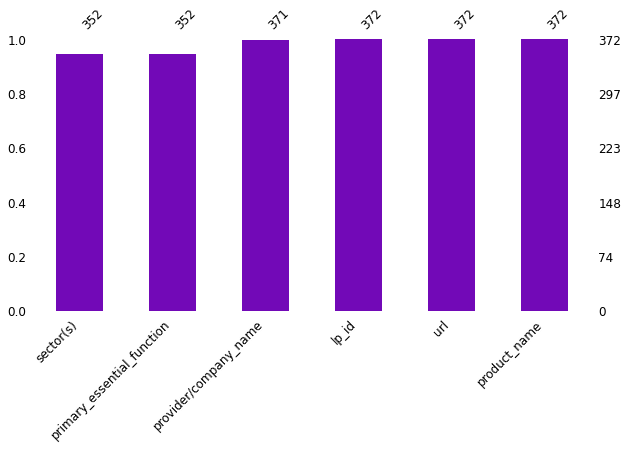

In [6]:
msno.bar(products_df,color='#7209b7', sort="ascending", figsize=(10,5), fontsize=12)
plt.show()

### Valores perdidos del districts dataset

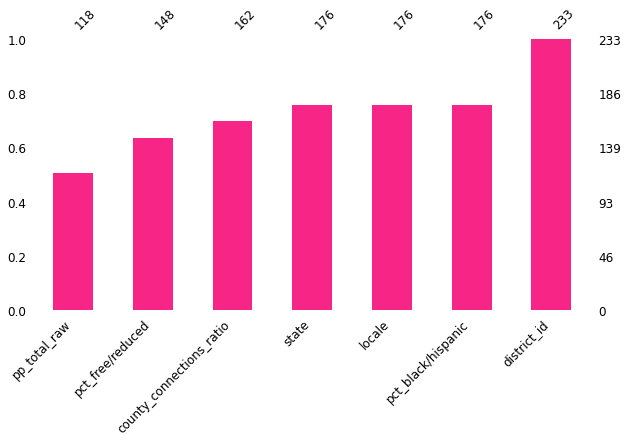

In [7]:
msno.bar(districts_df,color='#f72585', sort="ascending", figsize=(10,5), fontsize=12)
plt.show()

### Valores perdidos del engagement dataset

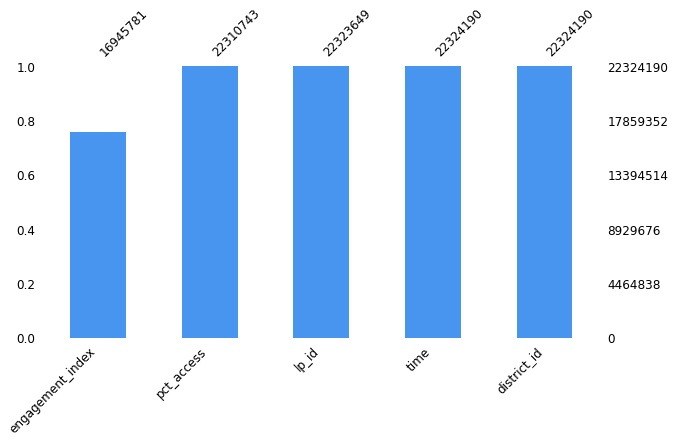

In [8]:
msno.bar(engagement_df,color='#4895ef', sort="ascending", figsize=(10,5), fontsize=12)
plt.show()

## Procesamiento de los datos del  District Dataset

In [9]:
# Mostrar el nombre de las columnas
districts_df.columns

Index(['district_id', 'state', 'locale', 'pct_black/hispanic',
       'pct_free/reduced', 'county_connections_ratio', 'pp_total_raw'],
      dtype='object')

In [10]:
# Mostrar información de los datos
districts_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 233 entries, 0 to 232
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   district_id               233 non-null    int64 
 1   state                     176 non-null    object
 2   locale                    176 non-null    object
 3   pct_black/hispanic        176 non-null    object
 4   pct_free/reduced          148 non-null    object
 5   county_connections_ratio  162 non-null    object
 6   pp_total_raw              118 non-null    object
dtypes: int64(1), object(6)
memory usage: 12.9+ KB


### Distritos por Distribución Estatal
A continuación, se utiliza un gráfico de barras para mostrar los distritos por distribución estatal

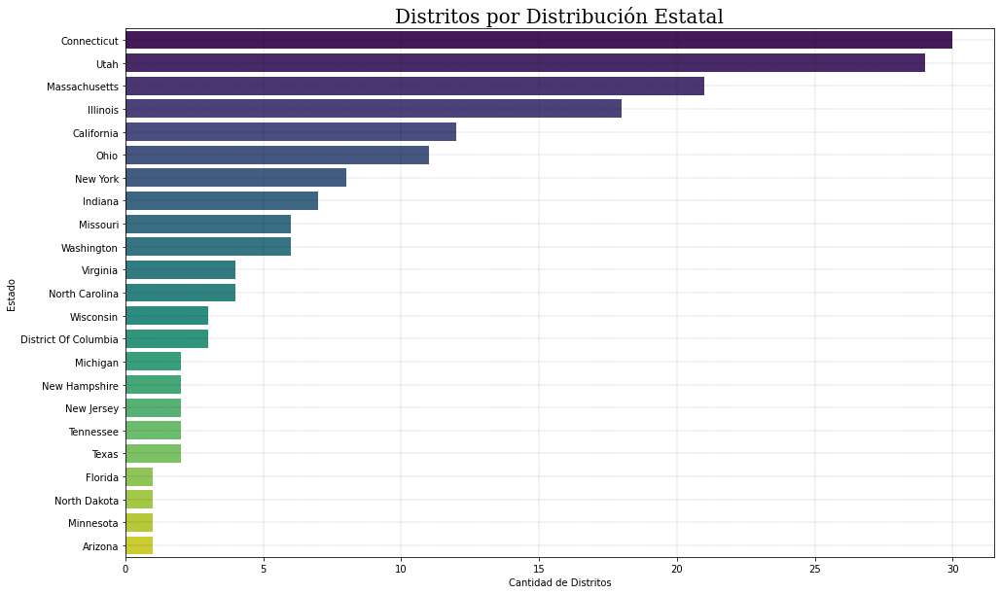

In [22]:
plt.figure(figsize=(16, 10))
sns.countplot(y="state",data=districts_df,order=districts_df.state.value_counts().index,palette="viridis",linewidth=3)
plt.title("Distribución de Distritos por Estado",font="Serif", size=20)
plt.ylabel('Estado')
plt.xlabel('Cantidad de Distritos')
plt.grid(color='black', linestyle='dotted', linewidth=0.25)
plt.show()

### Otra Forma de Visualizarlo
A continuación apreciamos otra forma de visualizar la distribución de distritos por estado.

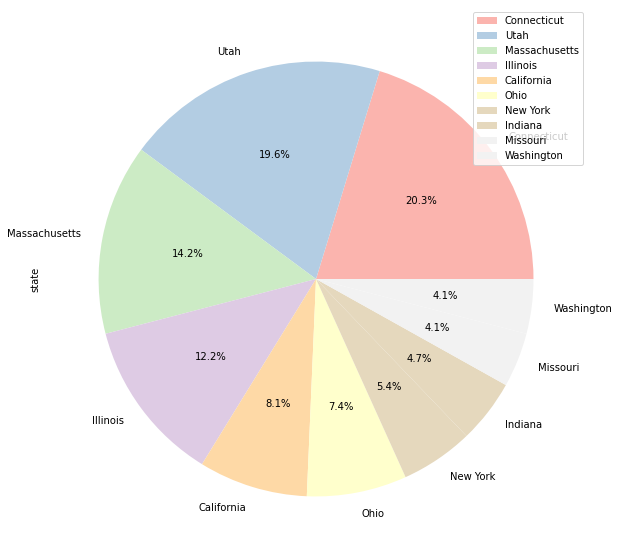

In [42]:
districts_df["state"].value_counts().head(10).plot(kind = 'pie', autopct='%1.1f%%', figsize=(10, 10), startangle=0, colormap = 'Pastel1').legend()
plt.show()

A pesar de que los gráficos previos son una visualización de la misma información, queda claro que el gráfico de barras permite una mejor interpretación en cuanto a cantidad. Esto, dado que se requiere conocer el total y calcular el porcentaje para obtener la información en el gráfico de torta.

### Crear gráfico circular para columnas de configuración regional

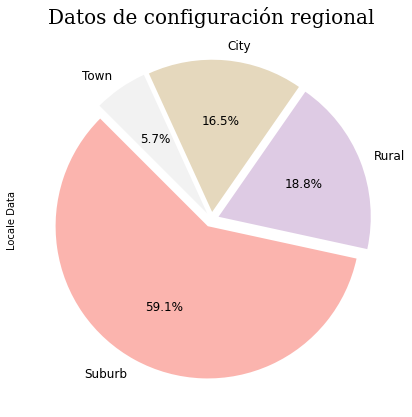

In [43]:
districts_df['locale'].value_counts().plot(kind='pie',
                                           explode=[0.05, 0.05, 0.05, 0.05],
                                           fontsize=12,
                                           autopct='%3.1f%%',
                                           figsize=(7,7),
                                           startangle=135,
                                           cmap='Pastel1')
plt.ylabel("Locale Data")
plt.title("Datos de configuración regional",font="Serif", size=20)
plt.show()

El gráfico circular muestra que los suburbios tienen un porcentaje mayor que Rural, City y Town de la columna de configuración regional

### Configuración regional y distribución estatal
Se procede a unir los datos mostrados previamente para mostrar la configuración (Suburb, Rural, City y Town) para cada estado

In [45]:
# Primero se eliminan todos los valores que sean Nan de la columna de estados
datos = districts_df.dropna(subset=['state'])
datos.head()

,district_id,state,locale,pct_black/hispanic,pct_free/reduced,county_connections_ratio,pp_total_raw
0,8815,Illinois,Suburb,"[0, 0.2[","[0, 0.2[","[0.18, 1[","[14000, 16000["
2,4921,Utah,Suburb,"[0, 0.2[","[0.2, 0.4[","[0.18, 1[","[6000, 8000["
5,5987,Wisconsin,Suburb,"[0, 0.2[","[0, 0.2[","[0.18, 1[","[10000, 12000["
6,3710,Utah,Suburb,"[0, 0.2[","[0.4, 0.6[","[0.18, 1[","[6000, 8000["
7,7177,North Carolina,Suburb,"[0.2, 0.4[","[0.2, 0.4[","[0.18, 1[","[8000, 10000["


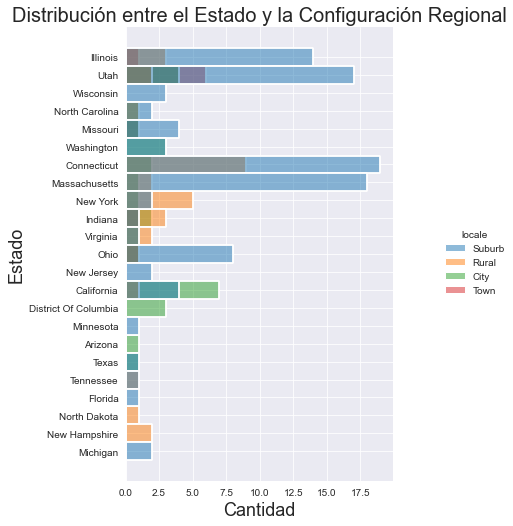

In [50]:
sns.set_style("darkgrid")
sns.displot(data=datos, y='state', hue='locale', height=7, aspect=0.8)
plt.title("Distribución entre el Estado y la Configuración Regional", fontsize = 20)
plt.ylabel("Estado",fontsize = 18)
plt.xlabel("Cantidad",fontsize = 18)
plt.show()

A continuación, se subdivide por Suburb, Rural, City y Town, y se aprecia la cantidad para cada estado

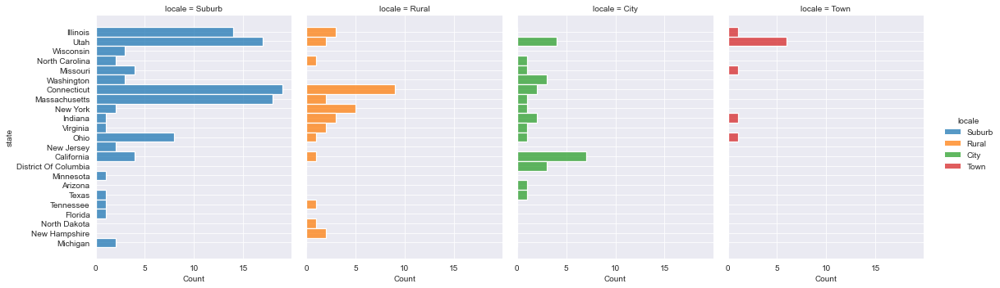

In [52]:
sns.set_style("darkgrid")
sns.displot(data=datos, y='state', hue='locale', col='locale', aspect=0.8)
plt.show()

Basado en los resultados expuestos en los gráficos previos podemos concluir que:
- La mayoría de los suburbios se encuentran en los estados de Utah, Illinois, Connecticut y Massachusetts.
- La mayoría de las áreas rurales se encuentran en los estados de Connecticut, Nueva York e Illinois.
- La mayoría de las ciudades se encuentran en el estado de California y Utah.
- La mayoría de las ciudades se encuentran en el estado de Utah.

### Ocurrencia de estados en los datos de información del distrito

In [5]:
ds = districts_df['state'].value_counts().reset_index()
ds.columns = [
    'state', 
    'percent'
]
ds['percent'] /= len(districts_df)

fig = px.pie(
    ds, 
    names='state', 
    values='percent',
    color_discrete_sequence=px.colors.sequential.Mint,
    title='Ocurrencia de estados en los datos de información del distrito:', 
    width=700,
    height=500
)
fig.show()

- Desde el gráfico previo podemos apreciar que solo 4 estados concentran más de 50% de la ocurrencia de estados en los datos de información del distrito, siendo estos Connecticut (17%), Utah (16.5%), Massachusetts (11.9%) y Illinois (10.2), los cuáles suman un 55.6%

## A continuación, se muestra la cantidad de la relación pct_blac/hispanic por cada configuración regional.

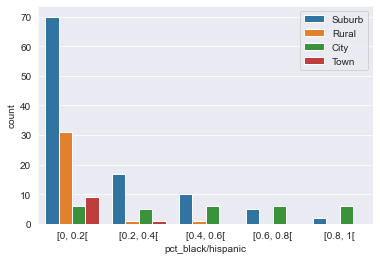

In [56]:
sns.countplot(data=districts_df, x='pct_black/hispanic',
             order = districts_df['pct_black/hispanic'].value_counts().index,
             hue='locale')
plt.legend(loc="upper right")
plt.show()

- Apreciamos en el gráfico previo que la mayor cantidad de la relación black/hispanic se concentra en suburbios. Por el contrario 'Town' indica que su relación black/hispanic es cero para porcentajes mayores a 60%. En ciudad el porcentaje se aprecia que se mantiene constante.
- De igual forma, se hace difícil extrar de forma directa nueva información, por esto se realizar cierto cálculos con el data frame.

In [7]:
# Extracción pct_black_hispanic
# Eliminar símbolos y separar el número
pct_black_hispanic = districts_df['pct_black/hispanic'].str.split(',', n=1, expand=True)
districts_df['pct_black'] = pct_black_hispanic[0].str.replace('[','',regex=True)
districts_df['pct_hispanic'] = pct_black_hispanic[1].str.replace('[','',regex=True)
districts_df['pct_black'] = pd.to_numeric(districts_df['pct_black'])
districts_df['pct_hispanic'] = pd.to_numeric(districts_df['pct_hispanic'])
districts_df['pct_black_and_hispanic']=(districts_df['pct_black'] + districts_df['pct_hispanic'])/2


pct_free_reduced = districts_df['pct_free/reduced'].str.split(",",n=1,expand=True)
# extraer pct_free y pct_reduced
districts_df['pct_free']=pct_free_reduced[0].str.replace('[','',regex=True)
districts_df['pct_reduced']= pct_free_reduced[1].str.replace('[','',regex=True)
# convertir pct_free y pct_reduced a números
districts_df['pct_free']=pd.to_numeric(districts_df['pct_free'])
districts_df['pct_reduced']=pd.to_numeric(districts_df['pct_reduced'])
districts_df['pct_free'].fillna(districts_df['pct_free'].median(), inplace=True)
districts_df['pct_reduced'].fillna(districts_df['pct_reduced'].median(), inplace=True)
#combinar pct_free y pct_reduced con el valor promedio
districts_df['pct_free_and_reduced']=(districts_df['pct_free'] + districts_df['pct_reduced'])/2
districts_df.head()

,district_id,state,locale,pct_black/hispanic,pct_free/reduced,county_connections_ratio,pp_total_raw,pct_black,pct_hispanic,pct_black_and_hispanic,pct_free,pct_reduced,pct_free_and_reduced
0,8815,Illinois,Suburb,"[0, 0.2[","[0, 0.2[","[0.18, 1[","[14000, 16000[",0.0,0.2,0.1,0.0,0.2,0.1
1,2685,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.2,0.4,0.3
2,4921,Utah,Suburb,"[0, 0.2[","[0.2, 0.4[","[0.18, 1[","[6000, 8000[",0.0,0.2,0.1,0.2,0.4,0.3
3,3188,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.2,0.4,0.3
4,2238,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.2,0.4,0.3


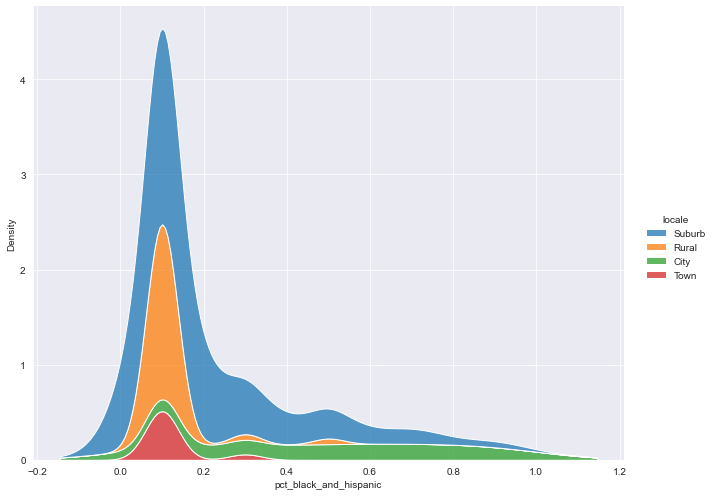

In [90]:
# Gráfico de distribución para pct_black, pct_hispanic y el promedio de pct_black/hispanic
#sns.displot(data=districts_df, x='pct_black', hue='locale', kind='kde',multiple="stack")
#sns.displot(data=districts_df, x='pct_hispanic', hue='locale', kind='kde',multiple="stack")
sns.displot(data=districts_df, x='pct_black_and_hispanic', hue='locale', kind='kde',multiple="stack",height=7, aspect=9/7)
plt.show()

- Nuevamente podemos observar una mayor concentración en los suburbios, pero qe no supera el 20%.
- De igual forma, City se aprecia que permanece constante en la mayoria de los porcentajes.
- A continuación, se analiza la cantidad de pct_hispanic y pct_black por estado para conocer los estados predominantes.

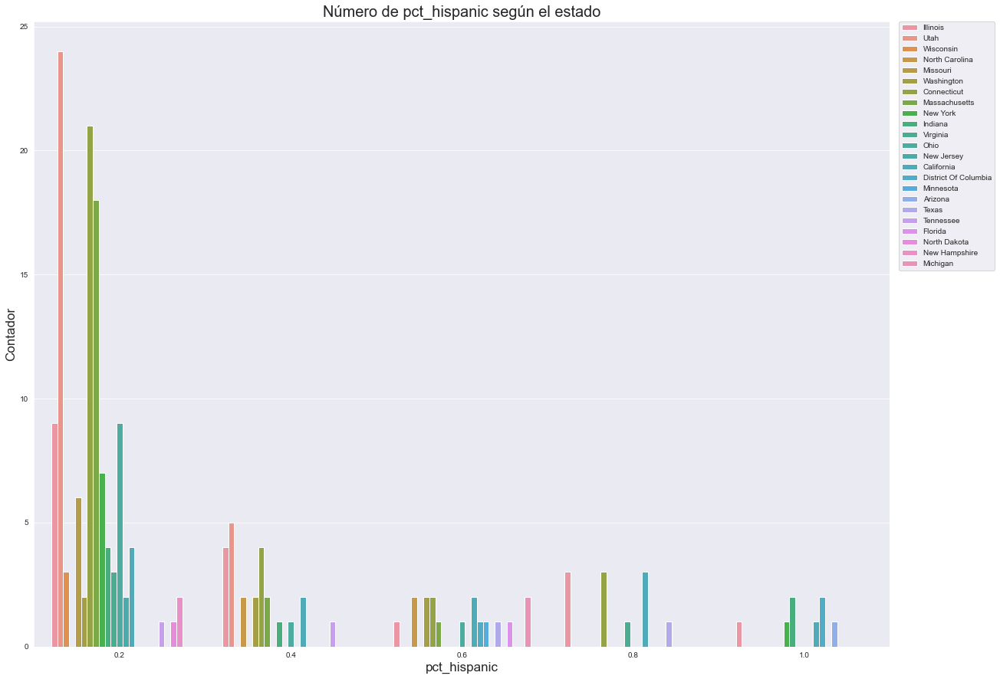

In [91]:
plt.figure(figsize = (20,15))
ax=sns.countplot(x = "pct_hispanic", data = districts_df, hue="state")
ax.set_title("Número de pct_hispanic según el estado", fontsize = 20)
plt.xlabel("pct_hispanic",fontsize=17)
plt.ylabel("Contador", fontsize=17)
plt.legend(bbox_to_anchor=(1.01, 1),
           borderaxespad=0)
plt.show()

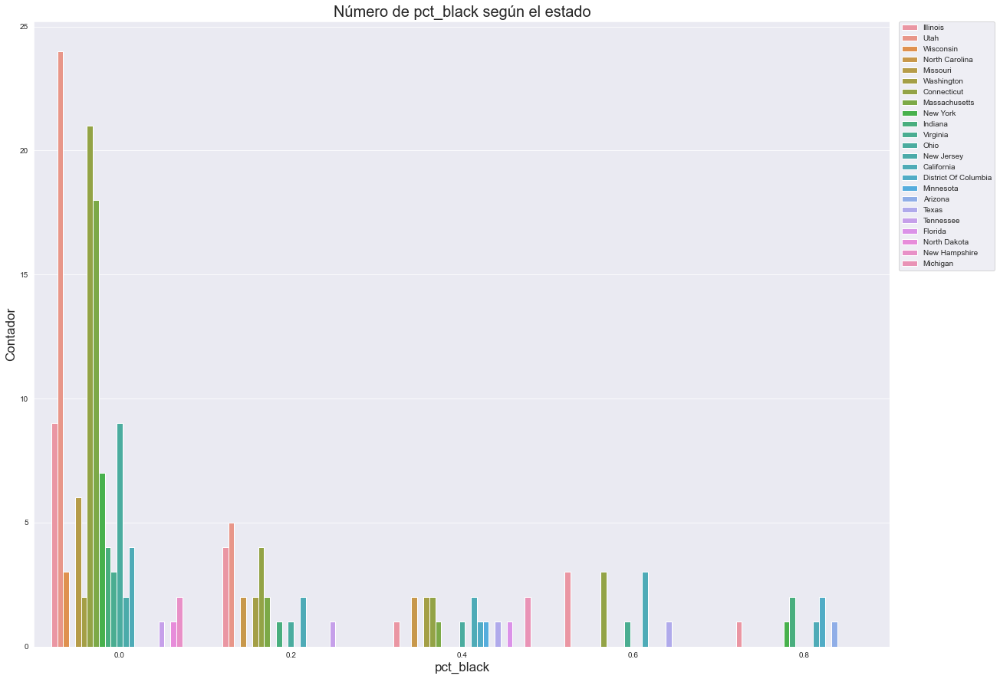

In [92]:
plt.figure(figsize = (20,15))
ax=sns.countplot(x = "pct_black", data = districts_df, hue="state")
ax.set_title("Número de pct_black según el estado", fontsize = 20)
plt.xlabel("pct_black",fontsize=17)
plt.ylabel("Contador", fontsize=17)
plt.legend(bbox_to_anchor=(1.01, 1),
           borderaxespad=0)
plt.show()

- Se aprecia que tanto para pct_hispanic y pct_black Illinois es el estado predominante, pero para un porcentaje cercano al 20%

## A continuación realizamos los mismos gráficos previos para para pct_free_and_reduced

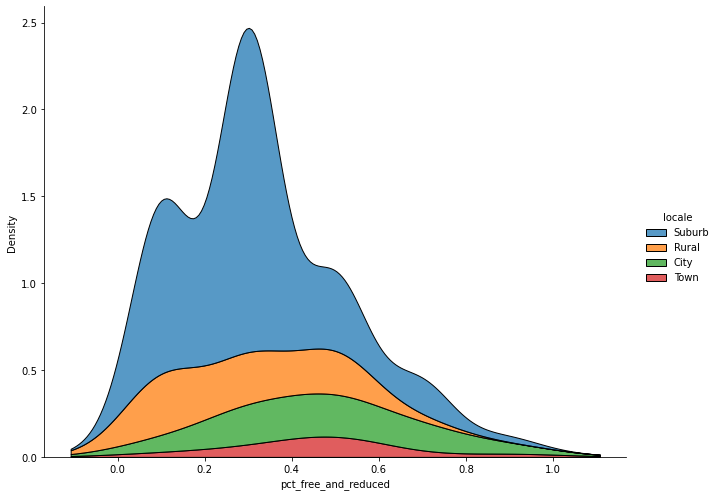

In [8]:
# Gráfico de distribución para pct_free_and_reduced.
sns.displot(data=districts_df, x='pct_free_and_reduced', hue='locale',kind='kde',multiple="stack",height=7, aspect=9/7)
plt.show()

- A diferencia del pct_black/hispanic para el pct_free_and_reduced se aprecia mucho más homogenizado y centrado en el 50%. Solo en el caso de los suburbios se observa que el pct_free_and_reduced esta desplazado hacia la mitad inferior izquierda.
- Nuevamente separamos por estado.

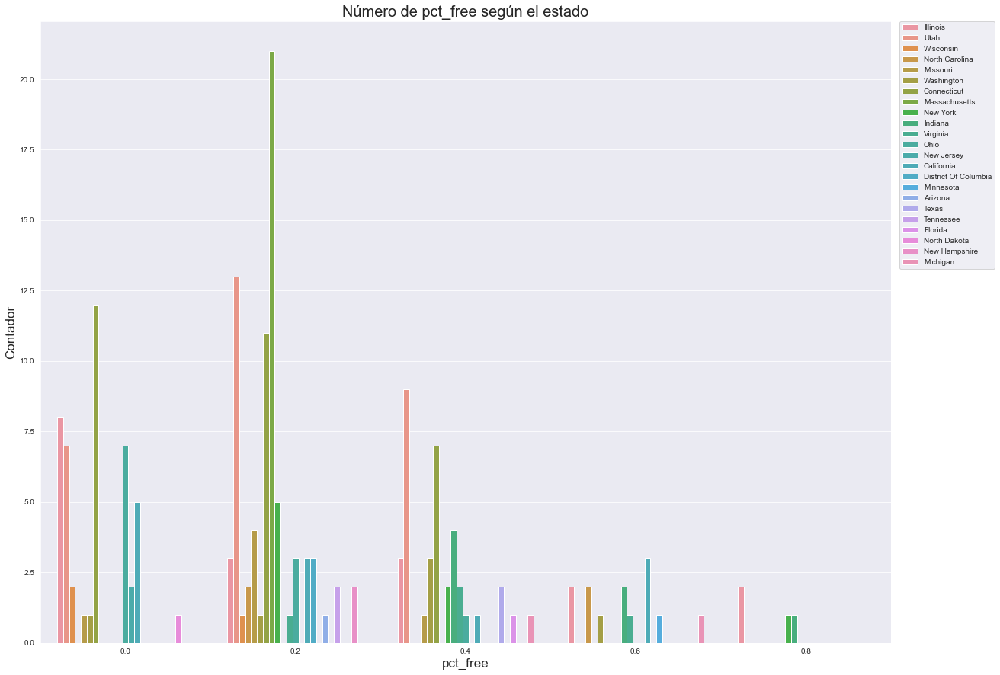

In [95]:
plt.figure(figsize = (20,15))
ax=sns.countplot(x = "pct_free", data = districts_df, hue="state")
ax.set_title("Número de pct_free según el estado", fontsize = 20)
plt.xlabel("pct_free",fontsize=17)
plt.ylabel("Contador", fontsize=17)
plt.legend(bbox_to_anchor=(1.01, 1),
           borderaxespad=0)
plt.show()

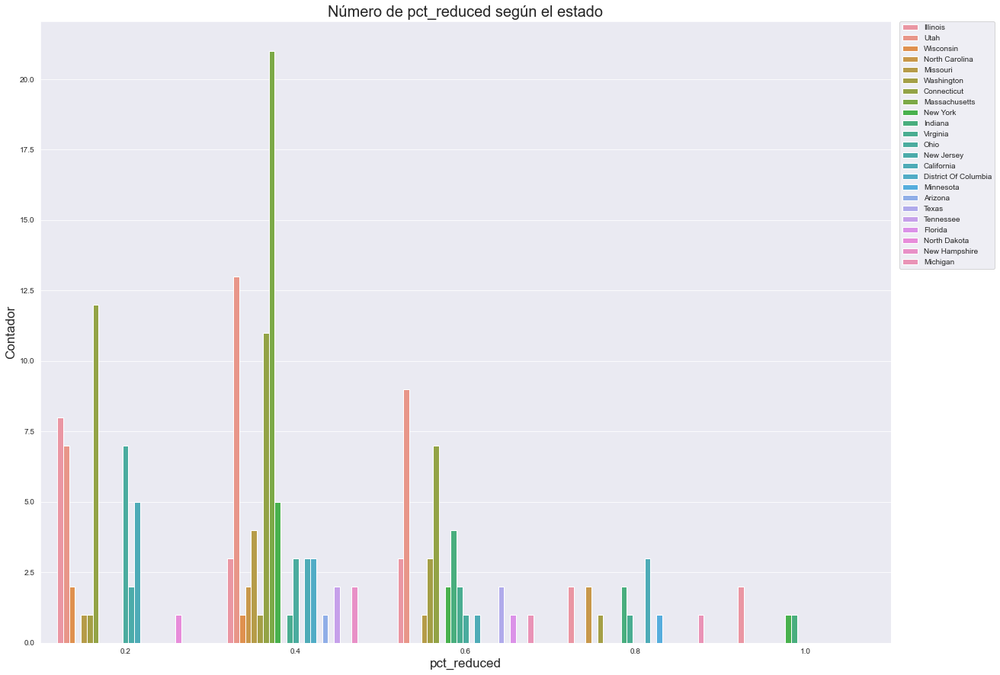

In [96]:
plt.figure(figsize = (20,15))
ax=sns.countplot(x = "pct_reduced", data = districts_df, hue="state")
ax.set_title("Número de pct_reduced según el estado", fontsize = 20)
plt.xlabel("pct_reduced",fontsize=17)
plt.ylabel("Contador", fontsize=17)
plt.legend(bbox_to_anchor=(1.01, 1),
           borderaxespad=0)
plt.show()

- Se aprecia que tanto para pct_free y pct_reduced New York es el estado predominante, pero para un porcentaje cercano al 40%

## Procesamiento de los datos del Product Dataset

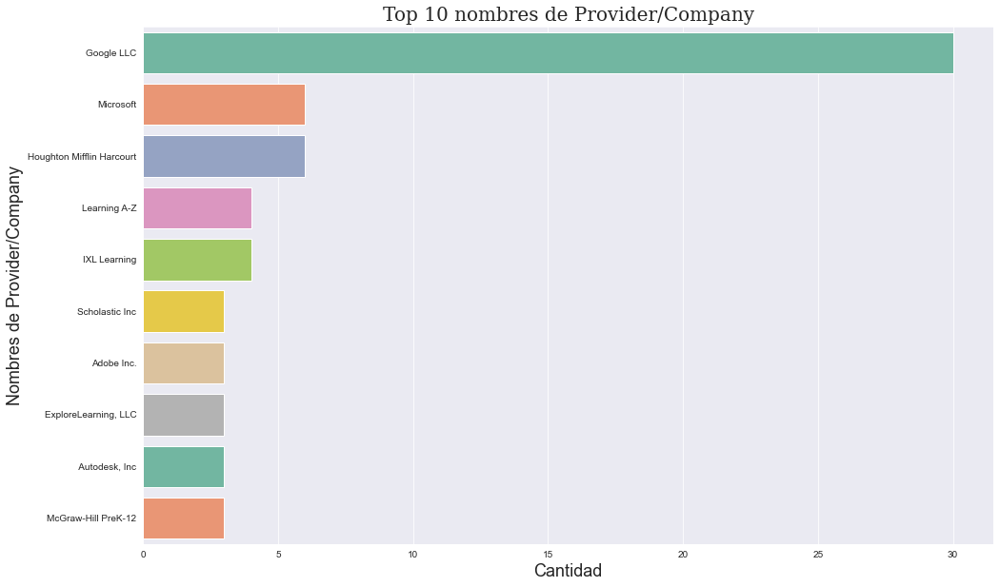

In [11]:
plt.figure(figsize=(16, 10))
sns.set_style("darkgrid")
sns.countplot(y='provider/company_name', data=products_df, order=products_df["provider/company_name"].value_counts().index[:10],palette = "Set2")
plt.title("Top 10 nombres de Provider/Company",font="Serif", size=20)
plt.ylabel('Nombres de Provider/Company', fontsize=18)
plt.xlabel('Cantidad', fontsize=18)
plt.show()

A partir del gráfio de barras recién expuesto podemos concluir que:
- Google LLC es el proveedor más utilizado
- Existe una gran diferencia en cuanto a uso, entre Google LLC en comparación con otros proveedores

### Distribución de sector(s) en los datos de información del distrito

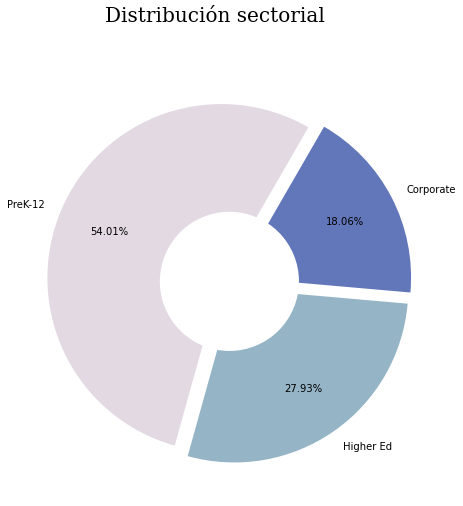

In [38]:
cmap = plt.cm.twilight
colors = cmap(np.linspace(0., 1., 9)) # Se genera una paleta de colores para el gráfico.

c1=c2=c3=0
for s in products_df["sector(s)"]:
    if(not pd.isnull(s)):
        s = s.split(";")
        for i in range(len(s)):
            sub = s[i].strip()
            if(sub == 'PreK-12'): c1+=1
            if(sub == 'Higher Ed'): c2+=1
            if(sub == 'Corporate'): c3+=1

fig, ax  = plt.subplots(figsize=(16, 8))
fig.suptitle('Distribución sectorial', size = 20, font="Serif", fontsize=20)
explode = (0.05, 0.05, 0.05)
labels = ['PreK-12','Higher Ed','Corporate']
sizes = [c1,c2, c3]
ax.pie(sizes, explode=explode,startangle=60, labels=labels,autopct='%1.2f%%', pctdistance=0.7, colors=colors,explode=explode)
ax.add_artist(plt.Circle((0,0),0.4,fc='white'))
plt.show()

Desde el gráfico recién mostrado podemos concluir que:
- Prek-12 tiene un porcentaje más alto de distribución sectorial

Si se es más riguroso en la separación de los sectores podemos apreciar el siguiente gráfico.

In [12]:
ds = products_df['sector(s)'].value_counts().reset_index()
ds.columns = [
    'sector(s)', 
    'percent'
]
ds['percent'] /= len(products_df)

fig = px.pie(
    ds, 
    names='sector(s)', 
    values='percent',
    color_discrete_sequence=px.colors.sequential.Mint,
    title='Distribución de sector(s) en los datos de información del distrito:', 
    width=700,
    height=500
)
fig.show()

- De igual forma se aprecia que las categrías que contienen Prek-12 tiene un porcentaje más alto de distribución sectorial

### Función Esencial Primaria
A continuación, se revisa cuales son las funciones esenciales primarias.

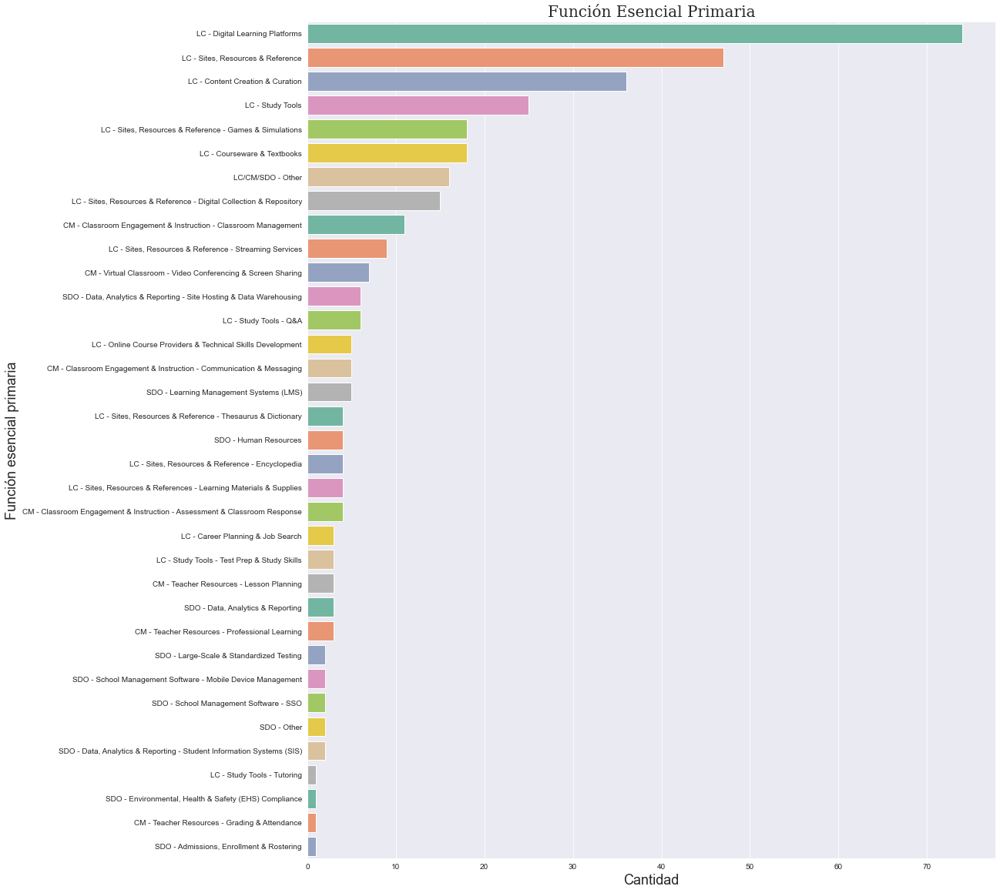

In [55]:
plt.figure(figsize=(16, 20))
sns.countplot(y='primary_essential_function', data=products_df, order=products_df["primary_essential_function"].value_counts().index,palette = "Set2")
plt.title("Función Esencial Primaria",font="Serif", size=20)
plt.ylabel('Función esencial primaria', fontsize=18)
plt.xlabel('Cantidad', fontsize=18)
plt.show()

- El gráfico anterior muestra que la Función Esencial Primaria es LC-Digital Learning

### A continuación, y combinando los gráficos previos, se realiza la separación de la función basado en el sector(s)

In [51]:
# Primero se eliminan todos los valores que sean Nan de la columna de función esencial primaria
datos = products_df.dropna(subset=['primary_essential_function'])
datos.head()

,lp_id,url,product_name,provider/company_name,sector(s),primary_essential_function
0,13117,https://www.splashmath.com,SplashLearn,StudyPad Inc.,PreK-12,LC - Digital Learning Platforms
1,66933,https://abcmouse.com,ABCmouse.com,"Age of Learning, Inc",PreK-12,LC - Digital Learning Platforms
2,50479,https://www.abcya.com,ABCya!,"ABCya.com, LLC",PreK-12,"LC - Sites, Resources & Reference - Games & Si..."
3,92993,http://www.aleks.com/,ALEKS,McGraw-Hill PreK-12,PreK-12; Higher Ed,LC - Digital Learning Platforms
4,73104,https://www.achieve3000.com/,Achieve3000,Achieve3000,PreK-12,LC - Digital Learning Platforms


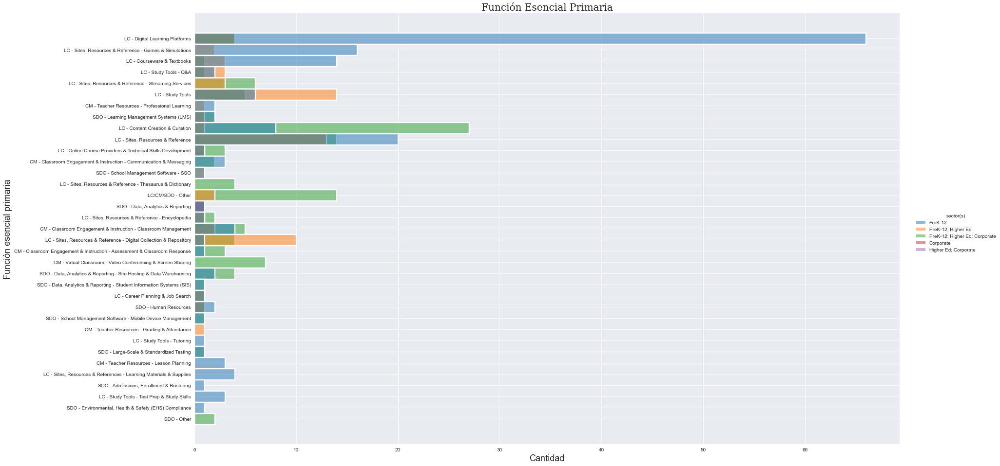

In [52]:
#products_df.head()
sns.set_style("darkgrid")
sns.displot(data=datos, y='primary_essential_function', hue='sector(s)', height = 13, aspect=2)
plt.title("Función Esencial Primaria",font="Serif", size=20)
plt.ylabel('Función esencial primaria', fontsize=18)
plt.xlabel('Cantidad', fontsize=18)
plt.show()

Podemos ahora separar por sector. Se recomienda ampliar la imagen en una nueva pestaña para una mejor apreciación

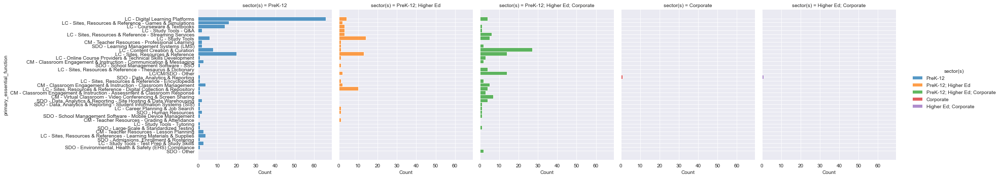

In [54]:
sns.set_style("darkgrid")
sns.displot(data=datos, y='primary_essential_function', hue='sector(s)', col='sector(s)', aspect=1.0)
plt.show()

Finalmente, y basado en los gráficos previos, podemos concluir que:
- La mayoría de los sectores de Prek-12 está ampliamente concentrados en LC-Digital Learning

## Procesamiento de los datos del Engagement Dataset

Los datos de participación se agregan a nivel de distrito escolar y cada archivo en la carpeta engagement_df representa datos de un distrito escolar. El nombre de archivo de 4 dígitos representa el id_distrito que se puede usar para enlazar con la información del distrito en district_info.csv. El lp_id se puede utilizar para vincular a la información del producto en product_info.csv. En esta sección, analizaremos los datos de interacción. Los datos de participación se agregan a nivel de distrito escolar y cada archivo en la carpeta engagement_df representa datos de un distrito escolar.

In [5]:
engagement_df.describe(include='all')

,time,lp_id,pct_access,engagement_index,district_id
count,22324190,2.232365e+07,2.231074e+07,1.694578e+07,22324190
unique,366,NaN,NaN,NaN,233
top,2020-12-10,NaN,NaN,NaN,2956
freq,102833,NaN,NaN,NaN,290683
mean,NaN,5.470879e+04,5.042399e-01,1.676063e+02,NaN
std,NaN,2.647069e+04,3.180568e+00,1.682223e+03,NaN
min,NaN,1.000300e+04,0.000000e+00,1.000000e-02,NaN
25%,NaN,3.085100e+04,0.000000e+00,3.700000e-01,NaN
50%,NaN,5.500700e+04,2.000000e-02,1.920000e+00,NaN
75%,NaN,7.766000e+04,9.000000e-02,1.365000e+01,NaN


In [5]:
engagement_df.dropna(inplace=True) # Eliminamos los valores Nan

In [6]:
engagement_df.reset_index(drop=True,inplace=True) # Reseteamos los índices.

In [7]:
engagement_df['time']=pd.to_datetime(engagement_df['time']) # añadimos la columna time

In [8]:
# Añadimos las columnas mont, date y date_week
engagement_df['month'] = engagement_df['time'].dt.month
engagement_df['date'] = engagement_df['time'].dt.day
engagement_df['date_week']=engagement_df['time'].dt.weekday
engagement_df.head()

,time,lp_id,pct_access,engagement_index,district_id,month,date,date_week
0,2020-01-01,17941.0,0.03,0.90,1000,1,1,2
1,2020-01-01,65358.0,0.03,1.20,1000,1,1,2
2,2020-01-01,98265.0,0.57,37.79,1000,1,1,2
3,2020-01-01,90153.0,0.06,3.90,1000,1,1,2
4,2020-01-01,29322.0,0.06,5.10,1000,1,1,2


In [9]:
# Agrupamos según los que queremos mostrar
date_agg = engagement_df.groupby(['date','month','date_week']).agg({'engagement_index':np.mean,'pct_access':np.mean})
date_agg.head()

engagement_index  pct_access
date month date_week                              
1    1     2                 16.770190    0.142265
     2     5                 19.333509    0.173311
     3     6                 46.032591    0.205511
     4     2                233.968220    0.778958
     5     4                187.377768    0.689469

In [10]:
date_agg=date_agg.reset_index() # Reseteamos los índices.

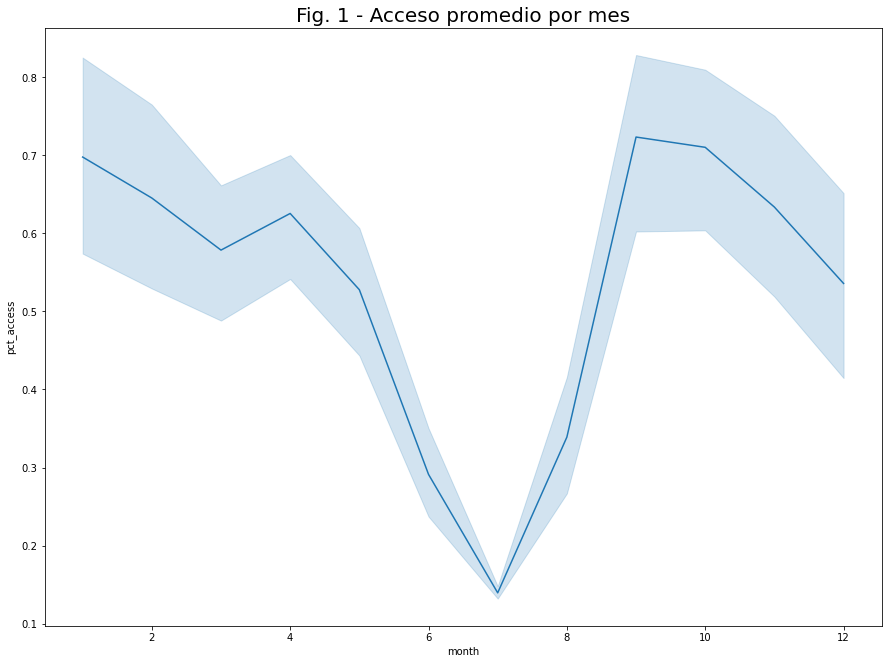

In [49]:
plt.figure(figsize=(15,11))
sns.lineplot(y=date_agg['pct_access'],x=date_agg["month"])
plt.title("Fig. 1 - Acceso promedio por mes", size=20)
plt.show()

En el gráfico anterior, se muestra el usuario promedio que accede a la plataforma cada mes. De junio a julio, hubo una disminución significativa, una de las probabilidades es a causa de las vacaciones de verano.

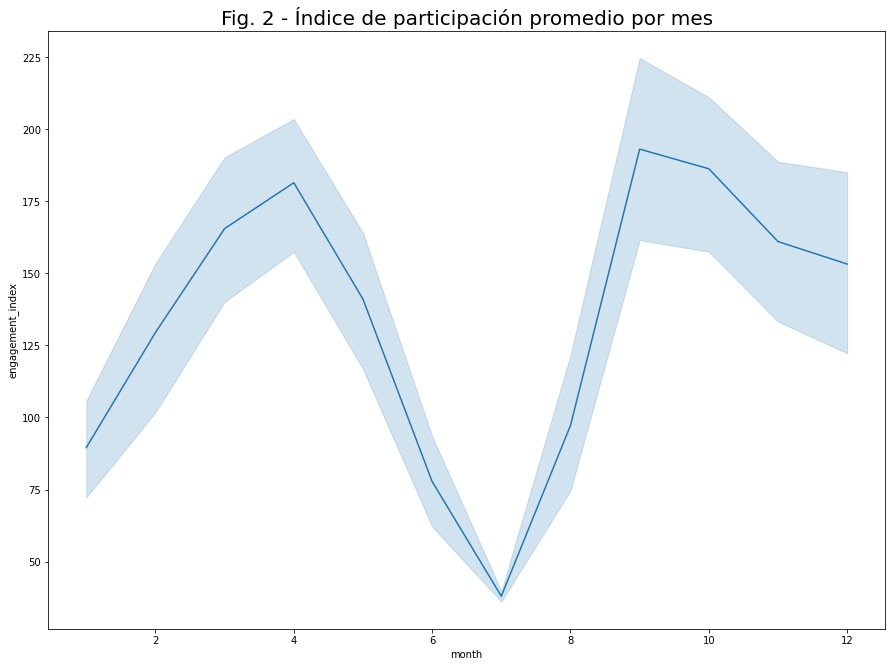

In [51]:
plt.figure(figsize=(15,11))
sns.lineplot(y=date_agg['engagement_index'],x=date_agg["month"],palette='rocket')
plt.title("Fig. 2 - Índice de participación promedio por mes", size=20)
plt.show()

En el gráfico anterior, se muestra el índice de participación promedio de cada mes. De junio a julio, hubo una disminución significativa, una de las probabilidades es a causa de las vacaciones de verano.

### ¿Cuál es el efecto de la pandemia de COVID-19 en el aprendizaje en línea y a distancia, y cómo podría evolucionar también en el futuro?

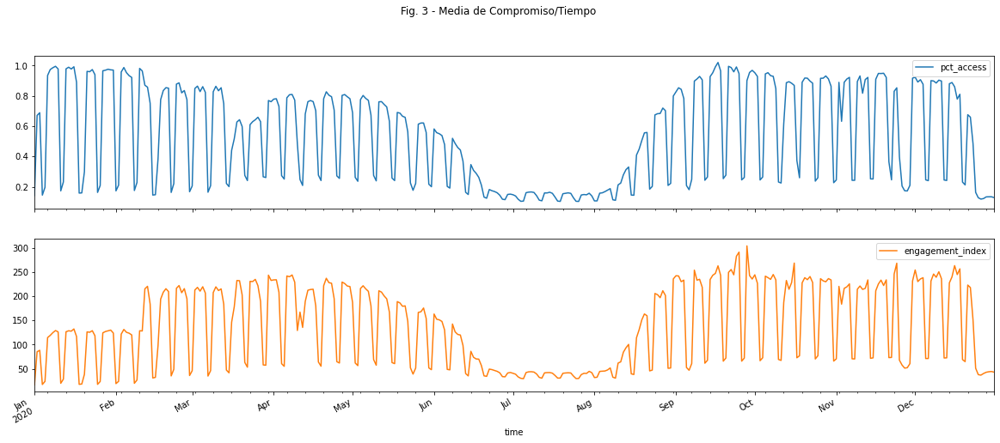

In [53]:
time_series_all = engagement_df.groupby(['time'])[['pct_access','engagement_index']].agg('mean')
time_series_all.plot(figsize=(20, 8), title='Fig. 3 - Media de Compromiso/Tiempo', subplots=True)
plt.show()

- Esta Figura nos da una primera idea respecto a la tendencia que siguen los datos. Se aprecia que durante los meses de Julio - Agosto existe una disminución en el acceso porcentual promedio y en el índice de participación promedio. Esto se relaciona con el periodo de vacaciones de verano en Estados Unidos. 

- De igual forma, coincide con el periodo pre covid y pos cuarentena en Estados Unidos.

In [12]:
# Se procesan las bases de datos Engagement y Products. Luego se unen a través de la llave lp_id
# Este proceso toma unos segundos en ejecutarse.
engagement_df.dropna(inplace=True)
engagement_df['month'] = engagement_df['time'].dt.month

products_df.dropna(inplace=True)
df = pd.merge(engagement_df,products_df,on=['lp_id'],how='left')
df['primary_essential_function'] = df['primary_essential_function'].str.split('-').str[0]

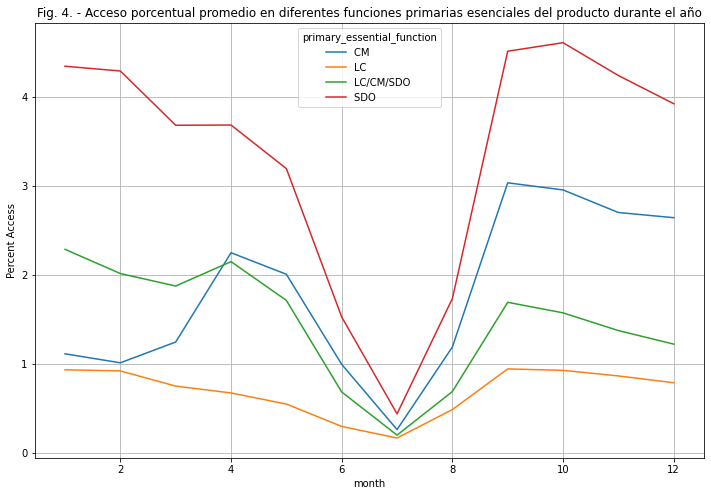

In [13]:
mydf1 = df.groupby(['month','primary_essential_function']).mean()['pct_access']
mydf1.unstack().plot(figsize=(12, 8) ,title="Fig. 4. - Acceso porcentual promedio en diferentes funciones primarias esenciales del producto durante el año")
plt.ylabel('Percent Access')
plt.grid()
plt.show()

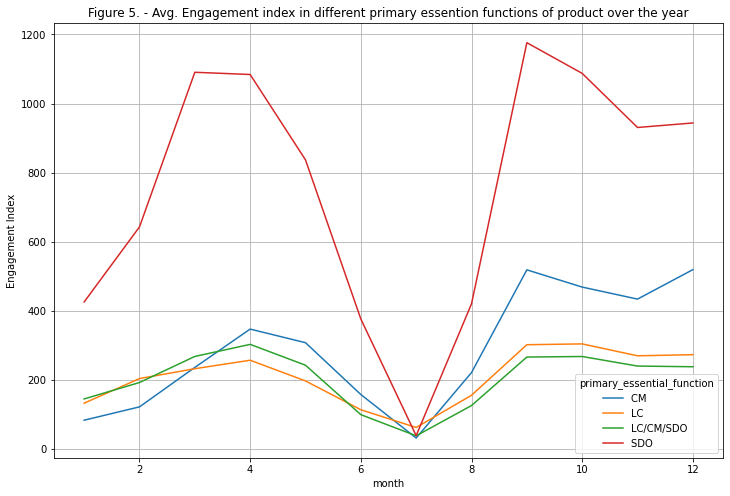

In [55]:
mydf2 = df.groupby(['month','primary_essential_function']).mean()['engagement_index']
mydf2.unstack().plot(figsize=(12, 8) ,title="Fig. 5. - Índice de participación promedio en diferentes funciones de esencia primaria del producto durante el año")
plt.ylabel('Engagement Index')
plt.grid()
plt.show()

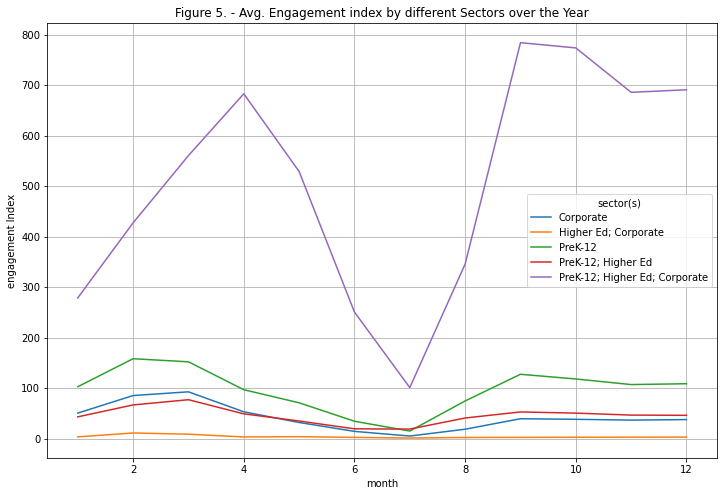

In [19]:
mydf3 = df.groupby(['month','sector(s)']).mean()['engagement_index']
mydf3.unstack().plot(figsize=(12, 8),title="Fig. 6. - Índice de participación promedio por diferentes sectores durante el año")
plt.ylabel('engagement Index')
plt.grid()
plt.show()

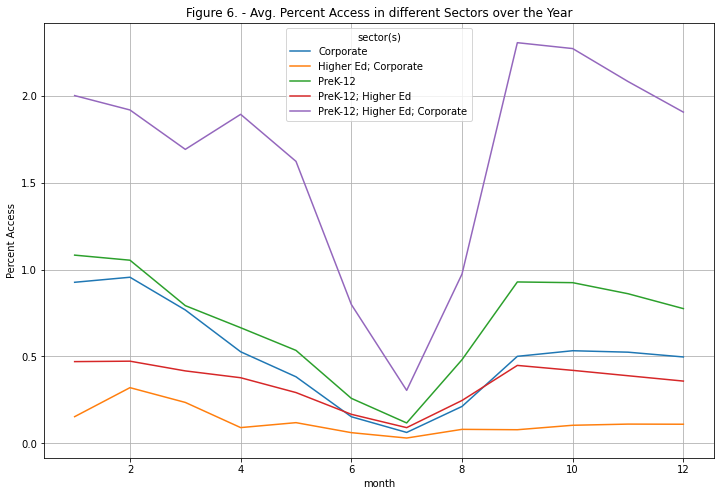

In [20]:
mydf4 = df.groupby(['month','sector(s)']).mean()['pct_access']
mydf4.unstack().plot(figsize=(12, 8) ,title="Fig. 7. - Acceso porcentual promedio en diferentes sectores durante el año")
plt.ylabel('Percent Access')
plt.grid()
plt.show()

- Las tecnologías utilizadas para el aprendizaje a distancia tienen una mayor adopción y un compromiso constante, después de una fuerte caída en julio, las escuelas y las empresas comenzaron a moverse hacia las tecnologías en línea, de las cuales las herramientas de gestión del aula (CM) en la fig. 4 y 5 muestran el nivel más alto que va desde cerca de 50 en Julio hasta casi 1200 en septiembre y permaneció cercano a eso hasta diciembre.

- Las tecnologías comunes a Prek12; Higher Ed; Corporate muestran el nivel más alto de participación a partir de agosto.

- Si bien para el futuro, después de leer la figura 6, podemos decir que para los tiempos de Covid, las tecnologías específicas del sector corporativo no se recuperaron bien después del trabajo de las restricciones domésticas a los niveles previos al covid, mientras que las tecnologías comunes a Prek12; Higher Ed; Corporate verán un aumentar si sigue la misma tendencia que se muestra en los meses de noviembre a diciembre.

### ¿Cómo cambia la participación de los estudiantes con los diferentes tipos de tecnología educativa durante el transcurso de la pandemia?

Primero dividiremos los datos en 2 partes: - período pre-covid (enero - marzo) y período de cuarentena (agosto - diciembre) para comparar el cambio de pct_access y engagement_index antes y durante el período covid.

### Antes de la cuarentena

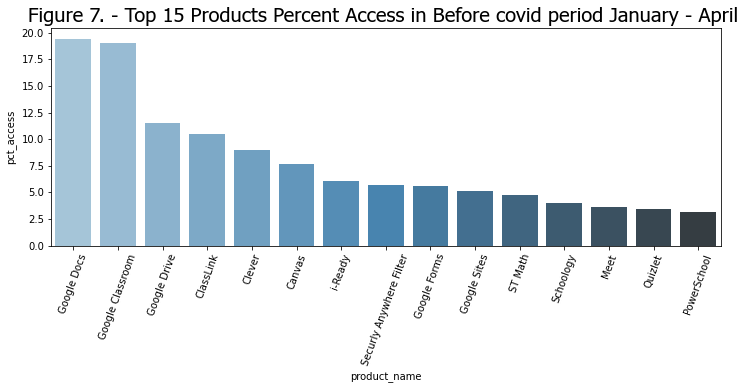

In [23]:
preLock = df[df['month']<4]
preLock = preLock[['pct_access','product_name','engagement_index']]
preLock1 =preLock.groupby('product_name').mean()
preLock1 =preLock1.sort_values('pct_access',ascending=False)
preLock1.reset_index(inplace=True)
plt.figure(figsize=(12, 4))
plt.xticks(rotation=70)
sns.barplot(x="product_name", y="pct_access", data=preLock1[:15],palette="Blues_d")
plt.title("Fig. 8. - Top 15: Productos Porcentaje de acceso en el período anterior a covid enero - abril" ,font = {'family': 'Tahoma','weight': 'normal','size': 20,})
plt.show()

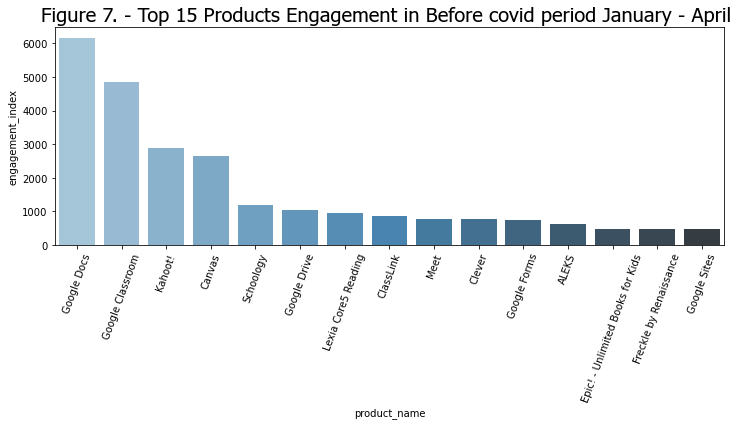

In [25]:
preLock2 =preLock.groupby('product_name').mean()
preLock2 =preLock2.sort_values('engagement_index',ascending=False)
preLock2 = pd.merge(preLock2,df[['product_name','primary_essential_function']],on=['product_name'],how='left')
preLock2.reset_index(inplace=True)
preLock2 =preLock2.drop_duplicates(subset=['product_name'] ,keep='first')
del preLock2['index']
plt.figure(figsize=(12, 4))
plt.xticks(rotation=70)
sns.barplot(x="product_name", y="engagement_index", data=preLock2[:15],palette="Blues_d")
plt.title("Fig. 9. - Top 15: Compromiso con los productos en el período anterior a covid de enero a abril " ,font = {'family': 'Tahoma','weight': 'normal','size': 20,})
plt.show()

### Después de la cuarentena

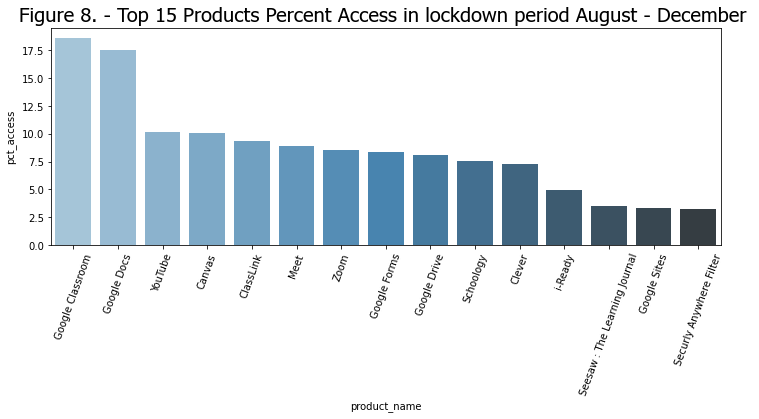

In [26]:
Lockdown = df[df['month']>=8]
Lockdown = Lockdown[['pct_access','product_name','engagement_index']]
Lockdown1 = Lockdown.groupby('product_name').mean()
Lockdown1 = Lockdown1.sort_values('pct_access',ascending=False)
Lockdown1.reset_index(inplace=True)
plt.figure(figsize=(12, 4))
plt.xticks(rotation=70)
sns.barplot(x="product_name", y="pct_access", data=Lockdown1[:15],palette="Blues_d")
plt.title("Fig. 10. - Top 15: Porcentaje de acceso a productos en período de bloqueo de agosto a diciembre " ,font = {'family': 'Tahoma','weight': 'normal','size': 20,})
plt.show()

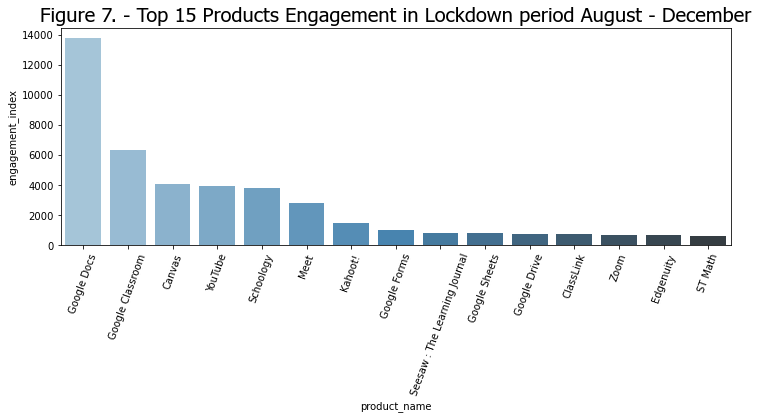

In [28]:
Lockdown2 = Lockdown.groupby('product_name').mean()
Lockdown2 = Lockdown2.sort_values('engagement_index',ascending=False)
Lockdown2 = pd.merge(Lockdown2,df[['product_name','primary_essential_function']],on=['product_name'],how='left')
Lockdown2.reset_index(inplace=True)
Lockdown2 = Lockdown2.drop_duplicates(subset=['product_name'] ,keep='first')
plt.figure(figsize=(12, 4))
plt.xticks(rotation=70)
sns.barplot(x="product_name", y="engagement_index", data=Lockdown2[:15],palette="Blues_d")
plt.title("Fig. 11. - Top 15: Compromiso de productos en período de cierre de agosto a diciembre" ,font = {'family': 'Tahoma','weight': 'normal','size': 20,})
plt.show()

- En el periodo posterior a Covid (agosto en adelante), muestra un aumento considerable en la participación en tecnologías de aprendizaje y circulum como google Docs, youtube, canvas, etc.

- Si bien youtube experimentó un salto masivo en el mismo período en que proporciona contenido de aprendizaje junto con google classrom, las personas de la suite de google pueden cambiar a una experiencia de aprendizaje completamente en línea, para responder adecuadamente a nuestra pregunta.

### Basado en las Figuras previas, Google Docs y Google Classroom son los más utilizados. Se trabajará con la información respecto a estos dos

In [15]:
# Se generan las bases de datps agrupadas según Google Classroom y Google Docs.
class_doc=df[(df["product_name"]=="Google Classroom")|(df["product_name"]=="Google Docs")]
pct=class_doc.groupby(["time", "product_name"])["pct_access"].mean().to_frame().reset_index()
eng=class_doc.groupby(["time", "product_name"])["engagement_index"].sum().to_frame().reset_index()

In [27]:
fig = px.line(pct, x="time", y="pct_access", color='product_name',title='Porcentaje de estudiantes con al menos un evento de carga de una página en un día determinado',
              template="ggplot2", width=1000, height=400)
fig.show()

fig = px.line(eng, x="time", y="engagement_index",title='Suma del número de páginas cargadas por cada 1000 estudiantes en un día determinado', color='product_name',
              template="seaborn", width=1000, height=400)
fig.show()

- Analizando las Figuras previas podemos apreciar una serie de tiempo respecto al porcentaje de acceso y el índice de participación. Estas tienen la misma tendencia ya antes expuesta mostrando una disminución en el periódo de vacaciones de verano en Estados Unidos (Julio - Agosto) y un aumento en el retorno a clases. Esto de igual forma se condice con los periodos de pre covid y pos cuarentena.

### A continuación se unirán las 3 bases de datos con el fin de obtener adicionalmente indicadores respecto a state, locale y pct_black/hispanic

In [30]:
engagement_df.dropna(inplace=True)

# Convertir el tipo de dato
engagement_df['district_id'] = engagement_df['district_id'].astype('int64')
engagement_df['lp_id'] = engagement_df['lp_id'].astype('int64')
# Separar los valores en 'Primary Essential Function'
products_df['Function Main Category']=products_df['primary_essential_function'].str.split("-")[0][0]
products_df['Function Sub Category']=products_df['primary_essential_function'].str.split("-")[0][1]
products_df.head()


,lp_id,url,product_name,provider/company_name,sector(s),primary_essential_function,Function Main Category,Function Sub Category
0,13117,https://www.splashmath.com,SplashLearn,StudyPad Inc.,PreK-12,LC - Digital Learning Platforms,LC,Digital Learning Platforms
1,66933,https://abcmouse.com,ABCmouse.com,"Age of Learning, Inc",PreK-12,LC - Digital Learning Platforms,LC,Digital Learning Platforms
2,50479,https://www.abcya.com,ABCya!,"ABCya.com, LLC",PreK-12,"LC - Sites, Resources & Reference - Games & Si...",LC,Digital Learning Platforms
3,92993,http://www.aleks.com/,ALEKS,McGraw-Hill PreK-12,PreK-12; Higher Ed,LC - Digital Learning Platforms,LC,Digital Learning Platforms
4,73104,https://www.achieve3000.com/,Achieve3000,Achieve3000,PreK-12,LC - Digital Learning Platforms,LC,Digital Learning Platforms


In [31]:
# Añadir la columna 'state' a 'engagements'. Este proceso demora unos segundos.
engagement_df['state']=np.nan
for state in districts_df['state'].unique():
    district_ids = districts_df[districts_df['state']==state]['district_id'].unique()
    for d_id in district_ids:
        engagement_df.loc[engagement_df['district_id']==int(d_id), 'state'] = state
engagement_df.head()

,time,lp_id,pct_access,engagement_index,district_id,month,date,date_week,state
0,2020-01-01,17941,0.03,0.90,1000,1,1,2,Connecticut
1,2020-01-01,65358,0.03,1.20,1000,1,1,2,Connecticut
2,2020-01-01,98265,0.57,37.79,1000,1,1,2,Connecticut
3,2020-01-01,90153,0.06,3.90,1000,1,1,2,Connecticut
4,2020-01-01,29322,0.06,5.10,1000,1,1,2,Connecticut


In [43]:
# Finalmente, se unen las bases de datos.
import gc
def merge_df(engagement_df, districts_df, products_df):
    df = engagement_df
    df = pd.merge(df, districts_df, left_on=['district_id','state'], right_on=['district_id','state'])
    df = pd.merge(df, products_df, left_on=['lp_id'], right_on=['lp_id'])
    df = df.drop('lp_id', axis=1)
    return df

df = merge_df(engagement_df, districts_df, products_df)
df.head()

,time,pct_access,engagement_index,district_id,month,date,date_week,state,locale,pct_black/hispanic,pct_free/reduced,county_connections_ratio,pp_total_raw,url,product_name,provider/company_name,sector(s),primary_essential_function,Function Main Category,Function Sub Category
0,2020-01-01,0.03,0.90,1000,1,1,2,Connecticut,Suburb,"[0.6, 0.8[","[0.2, 0.4[","[0.18, 1[",NaN,https://www.kidsa-z.com/main/Login,Kids A-Z,Lazel Inc.,PreK-12,LC - Digital Learning Platforms,LC,Digital Learning Platforms
1,2020-01-02,3.03,59.62,1000,1,2,3,Connecticut,Suburb,"[0.6, 0.8[","[0.2, 0.4[","[0.18, 1[",NaN,https://www.kidsa-z.com/main/Login,Kids A-Z,Lazel Inc.,PreK-12,LC - Digital Learning Platforms,LC,Digital Learning Platforms
2,2020-01-03,2.49,70.66,1000,1,3,4,Connecticut,Suburb,"[0.6, 0.8[","[0.2, 0.4[","[0.18, 1[",NaN,https://www.kidsa-z.com/main/Login,Kids A-Z,Lazel Inc.,PreK-12,LC - Digital Learning Platforms,LC,Digital Learning Platforms
3,2020-01-06,1.92,47.88,1000,1,6,0,Connecticut,Suburb,"[0.6, 0.8[","[0.2, 0.4[","[0.18, 1[",NaN,https://www.kidsa-z.com/main/Login,Kids A-Z,Lazel Inc.,PreK-12,LC - Digital Learning Platforms,LC,Digital Learning Platforms
4,2020-01-07,2.81,59.23,1000,1,7,1,Connecticut,Suburb,"[0.6, 0.8[","[0.2, 0.4[","[0.18, 1[",NaN,https://www.kidsa-z.com/main/Login,Kids A-Z,Lazel Inc.,PreK-12,LC - Digital Learning Platforms,LC,Digital Learning Platforms


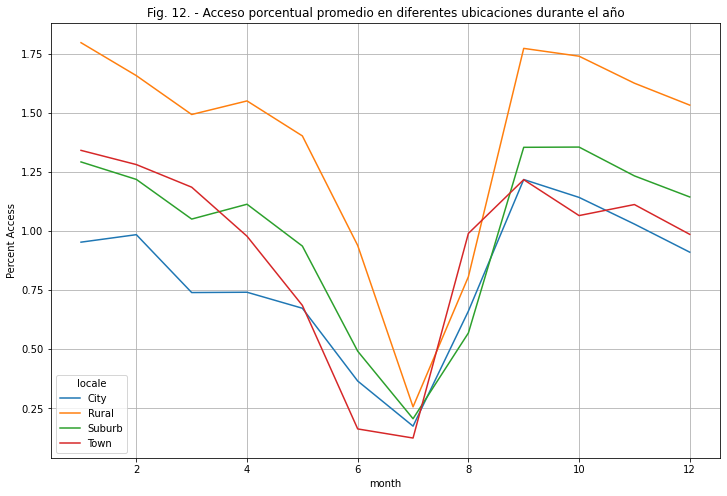

In [44]:
mydf5 = df.groupby(['month','locale']).mean()['pct_access']
mydf5.unstack().plot(figsize=(12, 8) ,title="Fig. 12. - Acceso porcentual promedio en diferentes ubicaciones durante el año")
plt.ylabel('Percent Access')
plt.grid()
plt.show()

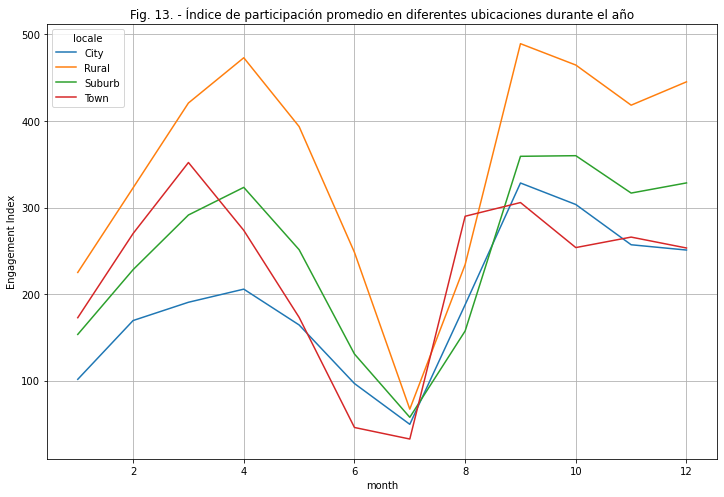

In [38]:
mydf5 = df.groupby(['month','locale']).mean()['engagement_index']
mydf5.unstack().plot(figsize=(12, 8) ,title="Fig. 13. - Índice de participación promedio en diferentes ubicaciones durante el año")
plt.ylabel('Engagement Index')
plt.grid()
plt.show()

- A partir de estas últimas dos Figuras, podemos concluir que es el sector rural es el que tuvo un mayor porcentaje promedio de acceso a internet durante el año.

- No se aprecia una tendencia clara de ningun sector pos cuarentena

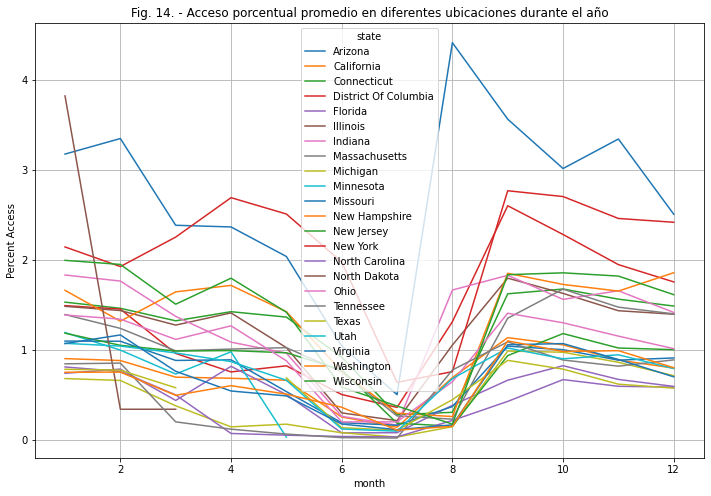

In [39]:
mydf5 = df.groupby(['month','state']).mean()['pct_access']
mydf5.unstack().plot(figsize=(12, 8) ,title="Fig. 14. - Acceso porcentual promedio en diferentes ubicaciones durante el año")
plt.ylabel('Percent Access')
plt.grid()
plt.show()

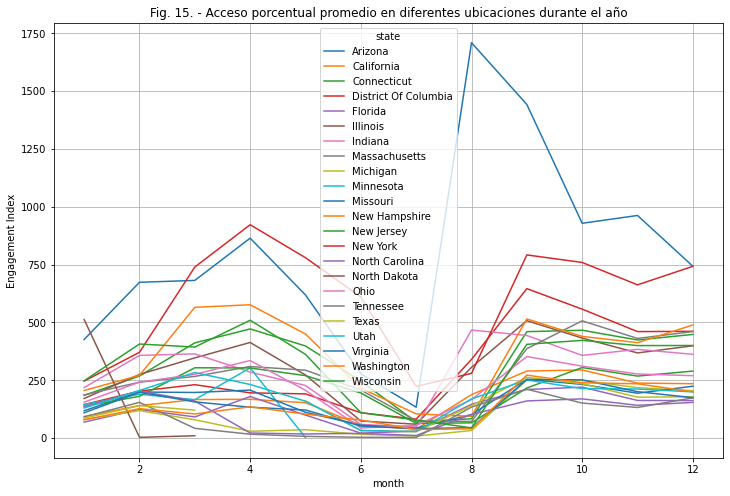

In [40]:
mydf6 = df.groupby(['month','state']).mean()['engagement_index']
mydf6.unstack().plot(figsize=(12, 8) ,title="Fig. 15. - Acceso porcentual promedio en diferentes ubicaciones durante el año")
plt.ylabel('Engagement Index')
plt.grid()
plt.show()

- Desde esta última Figura podemos concluir que el estado de Arizona presento un aumento considerable pos cuarentena respecto al porcentaje de acceso en el periodo pre covid.

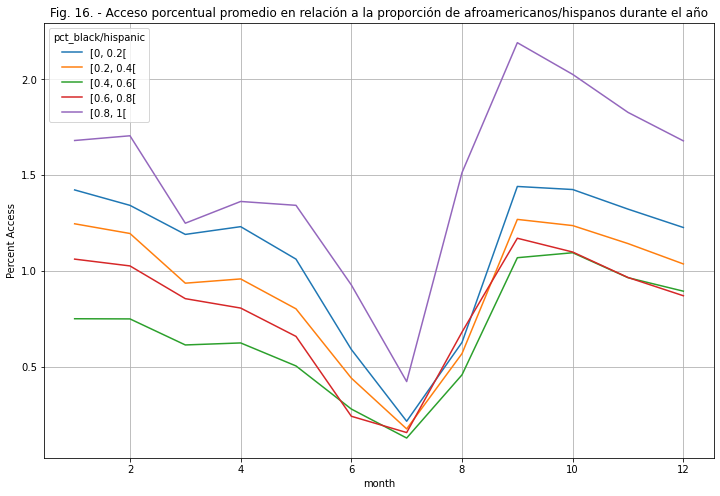

In [41]:
mydf7 = df.groupby(['month','pct_black/hispanic']).mean()['pct_access']
mydf7.unstack().plot(figsize=(12, 8) ,title="Fig. 16. - Acceso porcentual promedio en relación a la proporción de afroamericanos/hispanos durante el año")
plt.ylabel('Percent Access')
plt.grid()
plt.show()

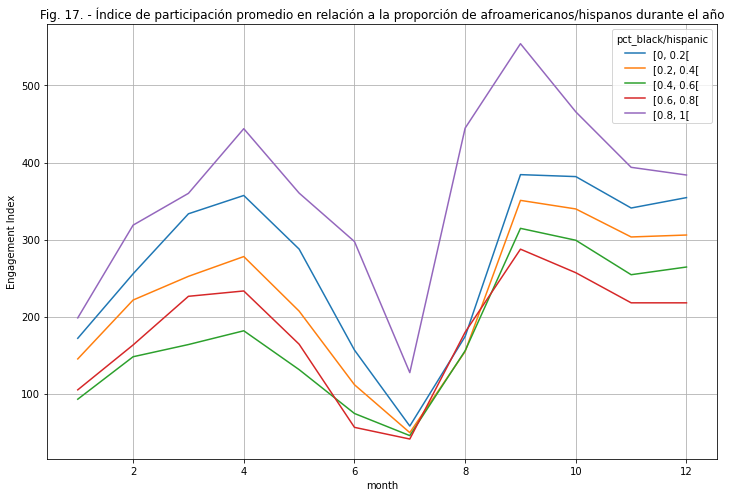

In [42]:
mydf8 = df.groupby(['month','pct_black/hispanic']).mean()['engagement_index']
mydf8.unstack().plot(figsize=(12, 8) ,title="Fig. 17. - Índice de participación promedio en relación a la proporción de afroamericanos/hispanos durante el año")
plt.ylabel('Engagement Index')
plt.grid()
plt.show()

- Las Figuras 16 y 17 muestra que los lugares donde la proporción de afroamericanos/hispanos es 0.8,1.0, tienen el nivel más alto de porcentaje de acceso e índice de participación entre los demás